# Single-Cell Analysis of Immune Response to Nanoplastic Particles

### Dataset Description

**Source:** [Zenodo](https://zenodo.org/records/15866724) (DOI:10.5281/zenodo.15866724)

**Samples:**
- **Sample 1:** 40 nm carboxylated polystyrene nanoparticles (PSNPs)
- **Sample 2:** 200 nm PSNPs
- **Sample 3:** 40 nm + 200 nm mixture
- **Sample 4:** Control (no exposure)

## Analysis Workflow

1. **QC & Preprocessing**: Load data, calculate QC metrics, filter cells/genes, normalize
2. **Integration & Clustering**: Merge samples, batch correction, PCA, UMAP, clustering
3. **Cell Type Annotation**: Identify cell types using marker genes
4. **Composition Analysis**: Compare cell type proportions across samples
5. **Differential Expression**: Find genes differentially expressed between conditions
6. **Size-Specific Effects**: Analyze particle size-specific responses

## Imports

In [1]:
# Core libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from statsmodels.stats.multitest import multipletests
import panhumanpy as ph
import gseapy as gp

# Single-cell analysis
import scanpy as sc
import scanpy.external as sce
import anndata as ad

# Configure plotting
warnings.filterwarnings('ignore')
sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=80, facecolor='white', frameon=False)
sns.set_style('whitegrid')

# Set random seed for reproducibility
np.random.seed(42)

print(f"Scanpy version: {sc.__version__}")
print(f"AnnData version: {ad.__version__}")

Scanpy version: 1.11.5
AnnData version: 0.12.19


## Task 1: QC & Preprocessing

In this section, we will:
1. Load all 4 samples and inspect the data
2. Calculate quality control metrics for each sample
3. Filter low-quality cells and genes
4. Normalize and log-transform the data
5. Prepare for integration

### 1.1 Load Data

In [2]:
# Import h5ad samples
files = [
    'data/filtered_feature_bc_matrix.h5ad',
    'data/filtered_feature_bc_matrix_Sample2.h5ad',
    'data/filtered_feature_bc_matrix_Sample3.h5ad',
    'data/filtered_feature_bc_matrix_Sample4.h5ad'
]

sample_identifiers = ['40nm', '200nm', 'mixture', 'control']

adata = [ad.read_h5ad(file) for file in files]

# Add sample identifiers
for i, sample_adata in enumerate(adata):
    sample_adata.obs['sample'] = sample_identifiers[i]
    
print("\n" + "="*80)
print("SAMPLES LOADED")
print("="*80)
for i, sample_adata in enumerate(adata):
    print(f"\nSample {i+1} ({sample_identifiers[i]}):")
    print(f"  Cells: {sample_adata.n_obs:,}")
    print(f"  Genes: {sample_adata.n_vars:,}")


SAMPLES LOADED

Sample 1 (40nm):
  Cells: 8,729
  Genes: 22,613

Sample 2 (200nm):
  Cells: 12,676
  Genes: 23,206

Sample 3 (mixture):
  Cells: 6,157
  Genes: 21,715

Sample 4 (control):
  Cells: 6,516
  Genes: 21,961


In [3]:
# Inspect first sample
print("\n" + "="*80)
print("DATA SUMMARY (Sample 1)")
print("="*80)
print(f"Number of cells: {adata[0].n_obs:,}")
print(f"Number of genes: {adata[0].n_vars:,}")
print(f"Total counts: {adata[0].X.sum():,.0f}")
print("\nAnnData object structure:")
print(adata[0])

print("\nCell metadata (obs) columns:")
print(adata[0].obs.columns.tolist())

print("\nGene metadata (var) columns:")
print(adata[0].var.columns.tolist())

print("\nFirst 5 cells (observations):")
display(adata[0].obs.head())

print("\nFirst 5 genes (variables):")
display(adata[0].var.head())


DATA SUMMARY (Sample 1)
Number of cells: 8,729
Number of genes: 22,613
Total counts: 5,384,382

AnnData object structure:
AnnData object with n_obs × n_vars = 8729 × 22613
    obs: 'nCount_RNA', 'nFeature_RNA', 'RNA_snn_res.0.3', 'seurat_clusters', 'predicted.id', 'prediction.score.CD14..monocyte', 'prediction.score.Dendritic.cell', 'prediction.score.Cytotoxic.T.cell', 'prediction.score.Plasmacytoid.dendritic.cell', 'prediction.score.B.cell', 'prediction.score.Natural.killer.cell', 'prediction.score.CD4..T.cell', 'prediction.score.Megakaryocyte', 'prediction.score.Unassigned', 'prediction.score.max', 'predicted.celltype.score', 'predicted.celltype', 'sample'
    var: 'vf_vst_counts_mean', 'vf_vst_counts_variance', 'vf_vst_counts_variance.expected', 'vf_vst_counts_variance.standardized', 'vf_vst_counts_variable', 'vf_vst_counts_rank', 'var.features', 'var.features.rank'
    obsm: 'X_pca', 'X_ref.pca', 'X_ref.umap', 'X_umap'
    layers: 'counts'

Cell metadata (obs) columns:
['nCount_RN

,nCount_RNA,nFeature_RNA,RNA_snn_res.0.3,seurat_clusters,predicted.id,prediction.score.CD14..monocyte,prediction.score.Dendritic.cell,prediction.score.Cytotoxic.T.cell,prediction.score.Plasmacytoid.dendritic.cell,prediction.score.B.cell,prediction.score.Natural.killer.cell,prediction.score.CD4..T.cell,prediction.score.Megakaryocyte,prediction.score.Unassigned,prediction.score.max,predicted.celltype.score,predicted.celltype,sample
AAACCCAAGTGGACGT-1,11609.0,3967,1,1,Cytotoxic T cell,0.0,0.0,0.723166,0.0,0.0,0.0,0.276834,0.0,0.0,0.723166,0.663782,CD4+ T cell,40nm
AAACCCACATTGCTTT-1,665.0,343,9,9,CD4+ T cell,0.0,0.0,0.168201,0.0,0.0,0.0,0.831799,0.0,0.0,0.831799,0.603951,CD4+ T cell,40nm
AAACCCAGTATCGTGT-1,2804.0,1370,1,1,Cytotoxic T cell,0.0,0.0,0.939139,0.0,0.0,0.0,0.060861,0.0,0.0,0.939139,0.905143,Cytotoxic T cell,40nm
AAACCCAGTGCCTAAT-1,5371.0,2540,1,1,Cytotoxic T cell,0.0,0.0,0.762929,0.0,0.0,0.0,0.237071,0.0,0.0,0.762929,0.730964,Cytotoxic T cell,40nm
AAACCCATCCCGAAAT-1,6467.0,2355,0,0,CD4+ T cell,0.0,0.0,0.027167,0.0,0.0,0.0,0.972833,0.0,0.0,0.972833,0.960456,CD4+ T cell,40nm



First 5 genes (variables):


,vf_vst_counts_mean,vf_vst_counts_variance,vf_vst_counts_variance.expected,vf_vst_counts_variance.standardized,vf_vst_counts_variable,vf_vst_counts_rank,var.features,var.features.rank
RP11-34P13.7,0.005499,0.005469,0.006774,0.807361,False,-2147483648,NaN,-2147483648
AL627309.1,0.004926,0.005132,0.006021,0.852320,False,-2147483648,NaN,-2147483648
AP006222.2,0.023943,0.028643,0.032703,0.875858,False,-2147483648,NaN,-2147483648
RP4-669L17.10,0.001031,0.001030,0.001126,0.914455,False,-2147483648,NaN,-2147483648
RP5-857K21.4,0.115019,0.149464,0.171291,0.872571,False,-2147483648,NaN,-2147483648


### 1.2 Quality Control (QC)

Calculate QC metrics to assess data quality:
- **n_genes_by_counts**: Number of genes expressed per cell
- **total_counts**: Total UMI counts per cell
- **pct_counts_mt**: Percentage of mitochondrial gene expression (indicator of cell stress/death)

In [4]:
print("\n" + "="*80)
print("QC METRICS CALCULATION")
print("="*80)

# Calculate QC metrics for all samples
for i, sample_adata in enumerate(adata):
    # Identify mitochondrial genes
    sample_adata.var['mt'] = sample_adata.var_names.str.lower().str.startswith('mt-') | \
                              sample_adata.var_names.str.startswith('MT-') | \
                              sample_adata.var_names.str.lower().str.startswith('mt')
    
    # Calculate QC metrics
    sc.pp.calculate_qc_metrics(
        sample_adata,
        qc_vars=['mt'],
        percent_top=None,
        log1p=False,
        inplace=True
    )
    
    print(f"\nSample {i+1} ({sample_identifiers[i]}):")
    print(f"  Mitochondrial genes detected: {sample_adata.var['mt'].sum()}")
    print(f"  QC metrics added: total_counts, n_genes_by_counts, pct_counts_mt")


QC METRICS CALCULATION

Sample 1 (40nm):
  Mitochondrial genes detected: 97
  QC metrics added: total_counts, n_genes_by_counts, pct_counts_mt

Sample 2 (200nm):
  Mitochondrial genes detected: 98
  QC metrics added: total_counts, n_genes_by_counts, pct_counts_mt

Sample 3 (mixture):
  Mitochondrial genes detected: 96
  QC metrics added: total_counts, n_genes_by_counts, pct_counts_mt

Sample 4 (control):
  Mitochondrial genes detected: 96
  QC metrics added: total_counts, n_genes_by_counts, pct_counts_mt


In [5]:
# Display QC statistics for each sample
print("\n" + "="*80)
print("QC STATISTICS PER SAMPLE")
print("="*80)

for i, sample_adata in enumerate(adata):
    print(f"\n{sample_identifiers[i].upper()}:")
    qc_stats = sample_adata.obs[['total_counts', 'n_genes_by_counts', 'pct_counts_mt']].describe()
    display(qc_stats)


QC STATISTICS PER SAMPLE

40NM:


,total_counts,n_genes_by_counts,pct_counts_mt
count,8729.000000,8729.000000,8729.000000
mean,616.838306,2138.856455,2.994360
std,64.134879,858.882524,1.012911
min,119.023884,216.000000,0.245027
25%,572.597558,1651.000000,2.569637
50%,617.521919,2022.000000,2.895997
75%,663.123067,2443.000000,3.255407
max,802.334778,10419.000000,44.724203



200NM:


,total_counts,n_genes_by_counts,pct_counts_mt
count,12676.000000,12676.000000,12676.000000
mean,619.584111,2022.669217,2.782568
std,60.725558,931.320082,0.821725
min,245.002215,204.000000,0.195310
25%,576.353446,1483.000000,2.421947
50%,620.356005,1799.000000,2.703188
75%,663.018713,2254.250000,3.016664
max,793.529414,9687.000000,19.944690



MIXTURE:


,total_counts,n_genes_by_counts,pct_counts_mt
count,6157.000000,6157.000000,6157.000000
mean,646.124907,2498.220887,2.963954
std,53.651076,1064.021537,1.135507
min,179.250280,211.000000,0.161256
25%,615.058424,1950.000000,2.546768
50%,645.392534,2345.000000,2.834745
75%,680.825098,2762.000000,3.153492
max,792.524819,10984.000000,26.436010



CONTROL:


,total_counts,n_genes_by_counts,pct_counts_mt
count,6516.000000,6516.000000,6516.000000
mean,655.819229,2819.597606,3.124461
std,55.157583,1089.322950,1.182225
min,168.118811,203.000000,0.520803
25%,623.811805,2275.000000,2.720513
50%,658.486385,2626.000000,3.030610
75%,693.422275,3094.000000,3.336881
max,789.670190,10910.000000,28.524132


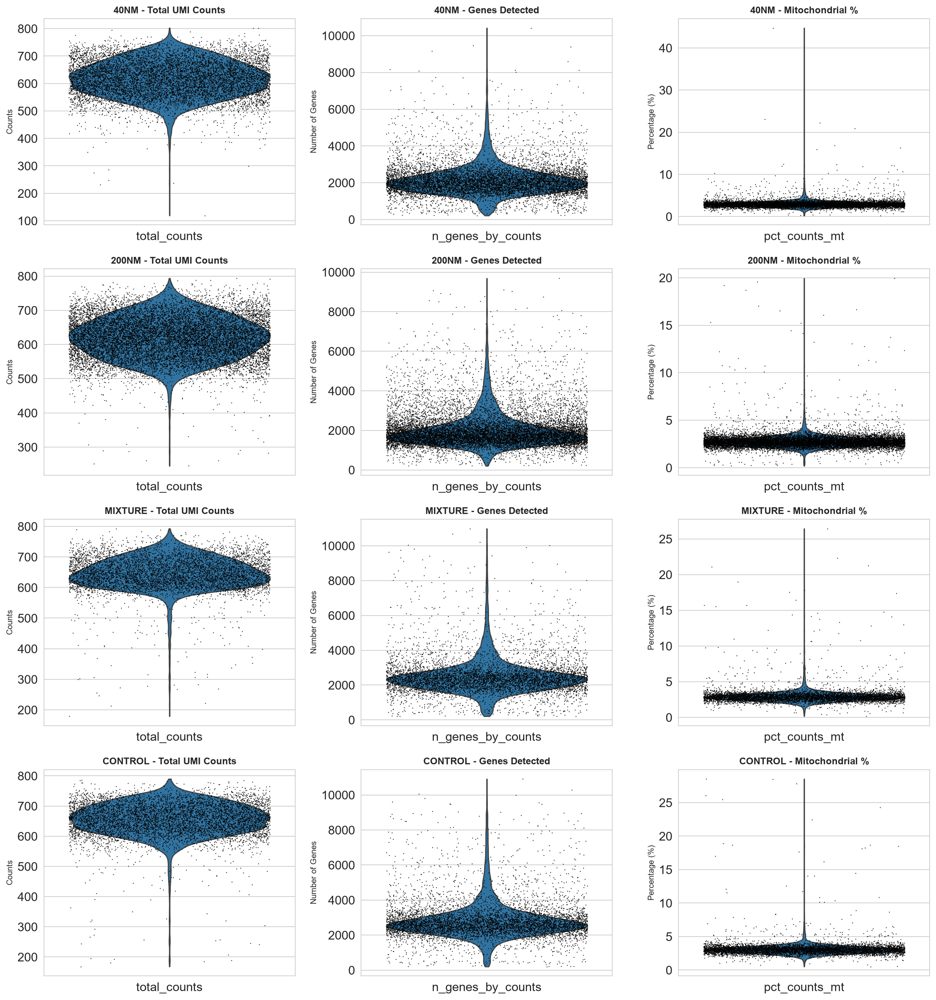

In [6]:
# Visualize QC metrics with violin plots for all samples
fig, axes = plt.subplots(4, 3, figsize=(15, 16))

for i, sample_adata in enumerate(adata):
    # Total counts per cell
    sc.pl.violin(
        sample_adata,
        ['total_counts'],
        jitter=0.4,
        ax=axes[i, 0],
        show=False
    )
    axes[i, 0].set_title(f'{sample_identifiers[i].upper()} - Total UMI Counts', 
                          fontsize=11, fontweight='bold')
    axes[i, 0].set_ylabel('Counts', fontsize=9)

    # Number of genes per cell
    sc.pl.violin(
        sample_adata,
        ['n_genes_by_counts'],
        jitter=0.4,
        ax=axes[i, 1],
        show=False
    )
    axes[i, 1].set_title(f'{sample_identifiers[i].upper()} - Genes Detected', 
                          fontsize=11, fontweight='bold')
    axes[i, 1].set_ylabel('Number of Genes', fontsize=9)

    # Mitochondrial percentage
    sc.pl.violin(
        sample_adata,
        ['pct_counts_mt'],
        jitter=0.4,
        ax=axes[i, 2],
        show=False
    )
    axes[i, 2].set_title(f'{sample_identifiers[i].upper()} - Mitochondrial %', 
                          fontsize=11, fontweight='bold')
    axes[i, 2].set_ylabel('Percentage (%)', fontsize=9)

plt.tight_layout()
plt.show()

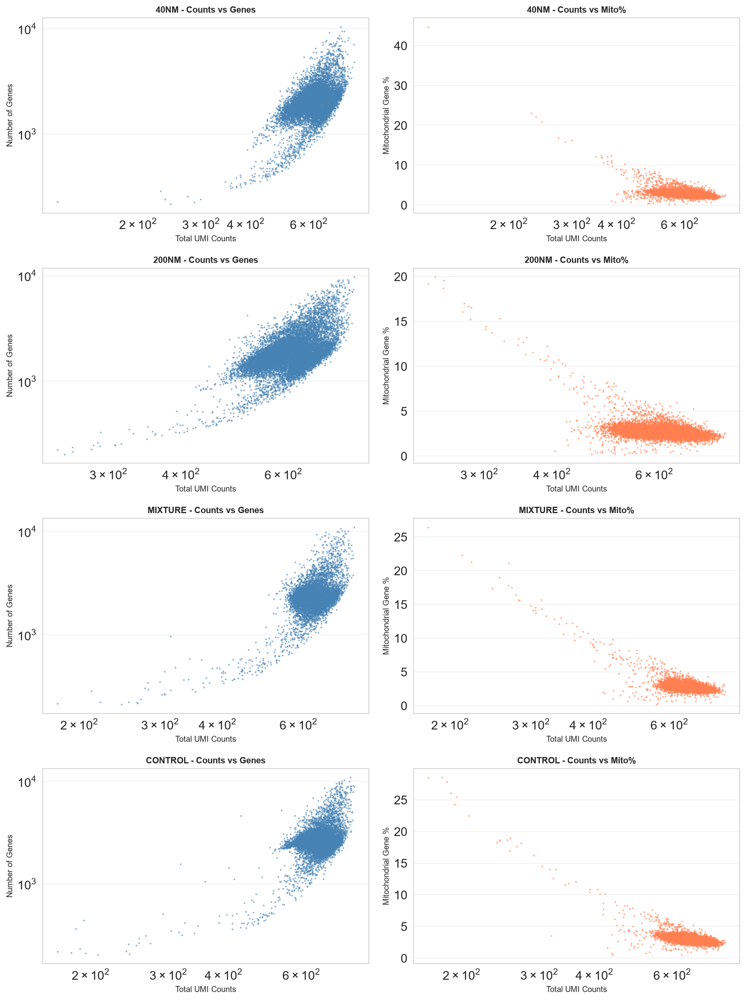

In [7]:
# Scatter plots to identify outliers and correlations
fig, axes = plt.subplots(4, 2, figsize=(12, 16))

for i, sample_adata in enumerate(adata):
    # Total counts vs genes detected
    axes[i, 0].scatter(
        sample_adata.obs['total_counts'],
        sample_adata.obs['n_genes_by_counts'],
        alpha=0.5,
        s=1,
        c='steelblue'
    )
    axes[i, 0].set_xlabel('Total UMI Counts', fontsize=9)
    axes[i, 0].set_ylabel('Number of Genes', fontsize=9)
    axes[i, 0].set_title(f'{sample_identifiers[i].upper()} - Counts vs Genes', 
                            fontsize=10, fontweight='bold')
    axes[i, 0].set_xscale('log')
    axes[i, 0].set_yscale('log')
    axes[i, 0].grid(True, alpha=0.3)

    # Total counts vs mitochondrial percentage
    axes[i, 1].scatter(
        sample_adata.obs['total_counts'],
        sample_adata.obs['pct_counts_mt'],
        alpha=0.5,
        s=1,
        c='coral'
    )
    axes[i, 1].set_xlabel('Total UMI Counts', fontsize=9)
    axes[i, 1].set_ylabel('Mitochondrial Gene %', fontsize=9)
    axes[i, 1].set_title(f'{sample_identifiers[i].upper()} - Counts vs Mito%', 
                            fontsize=10, fontweight='bold')
    axes[i, 1].set_xscale('log')
    axes[i, 1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 1.3 Filtering

We filter cells and genes based on QC metrics to remove low-quality data:

**Cell filtering criteria:**
- Minimum counts: 200 (cells with very low UMI counts)
- Minimum genes: 200 (cells expressing too few genes)
- Maximum genes: 5000 (potential doublets)
- Maximum mitochondrial %: 10% (dying/stressed cells)

**Gene filtering:**
- Minimum cells: 3 (genes expressed in very few cells)

In [8]:
print("\n" + "="*80)
print("FILTERING")
print("="*80)

# Define filtering thresholds
min_counts = 200
min_genes = 200
max_genes = 5000
max_pct_mt = 10.0

print(f"Filtering criteria:")
print(f"  - min_counts: {min_counts}")
print(f"  - min_genes: {min_genes}")
print(f"  - max_genes: {max_genes}")
print(f"  - max_pct_mt: {max_pct_mt}%")

# Filter each sample
for i, sample_adata in enumerate(adata):
    print(f"\n{sample_identifiers[i].upper()}:")
    cells_before = sample_adata.n_obs
    genes_before = sample_adata.n_vars
    print(f"  Cells before filtering: {cells_before:,}")
    print(f"  Genes before filtering: {genes_before:,}")
    
    # Filter cells based on QC metrics
    sc.pp.filter_cells(sample_adata, min_counts=min_counts)
    sc.pp.filter_cells(sample_adata, min_genes=min_genes)
    
    # Remove cells with too many genes (potential doublets)
    adata[i] = sample_adata[sample_adata.obs['n_genes_by_counts'] < max_genes, :].copy()
    
    # Remove cells with high mitochondrial content
    adata[i] = adata[i][adata[i].obs['pct_counts_mt'] < max_pct_mt, :].copy()
    
    # Filter genes (keep genes expressed in at least 3 cells)
    sc.pp.filter_genes(adata[i], min_cells=3)
    
    # Store the raw data for later use
    adata[i].layers["counts"] = adata[i].X.copy()
    
    print(f"  Cells after filtering: {adata[i].n_obs:,}")
    print(f"  Genes after filtering: {adata[i].n_vars:,}")
    print(f"  Cells removed: {cells_before - adata[i].n_obs:,} ({100*(cells_before - adata[i].n_obs)/cells_before:.1f}%)")
    print(f"  Genes removed: {genes_before - adata[i].n_vars:,} ({100*(genes_before - adata[i].n_vars)/genes_before:.1f}%)")


FILTERING
Filtering criteria:
  - min_counts: 200
  - min_genes: 200
  - max_genes: 5000
  - max_pct_mt: 10.0%

40NM:
  Cells before filtering: 8,729
  Genes before filtering: 22,613
filtered out 1 cells that have less than 200 counts
filtered out 263 genes that are detected in less than 3 cells
  Cells after filtering: 8,579
  Genes after filtering: 22,350
  Cells removed: 150 (1.7%)
  Genes removed: 263 (1.2%)

200NM:
  Cells before filtering: 12,676
  Genes before filtering: 23,206
filtered out 334 genes that are detected in less than 3 cells
  Cells after filtering: 12,413
  Genes after filtering: 22,872
  Cells removed: 263 (2.1%)
  Genes removed: 334 (1.4%)

MIXTURE:
  Cells before filtering: 6,157
  Genes before filtering: 21,715
filtered out 1 cells that have less than 200 counts
filtered out 513 genes that are detected in less than 3 cells
  Cells after filtering: 5,941
  Genes after filtering: 21,202
  Cells removed: 216 (3.5%)
  Genes removed: 513 (2.4%)

CONTROL:
  Cells b

### 1.4 Normalization

Normalization removes technical variation and makes cells comparable:
1. **Total count normalization**: Scale each cell to have the same total counts (10,000)
2. **Log transformation**: Apply log(x + 1) to stabilize variance

In [9]:
print("\n" + "="*80)
print("NORMALIZATION")
print("="*80)

# Normalize and log-transform each sample
for i, sample_adata in enumerate(adata):
    print(f"\n{sample_identifiers[i].upper()}:")
    
    # Total count normalization
    sc.pp.normalize_total(sample_adata, target_sum=1e4)
    
    # Log transformation
    sc.pp.log1p(sample_adata)
    
    print(f"  Data range: [{sample_adata.X.min():.2f}, {sample_adata.X.max():.2f}]")


NORMALIZATION

40NM:
normalizing counts per cell
    finished (0:00:00)
  Data range: [0.00, 4.90]

200NM:
normalizing counts per cell
    finished (0:00:00)
  Data range: [0.00, 4.83]

MIXTURE:
normalizing counts per cell
    finished (0:00:00)
  Data range: [0.00, 4.78]

CONTROL:
normalizing counts per cell
    finished (0:00:00)
  Data range: [0.00, 5.27]


## Task 2: Integration & Clustering

In this section, we will:
1. Merge all samples into a single AnnData object
2. Identify highly variable genes across samples
3. Perform batch correction using Combat
4. Perform PCA dimensionality reduction
5. Compute UMAP embedding
6. Cluster cells using Leiden algorithm
7. Visualize clusters and batch effects

### 2.1 Sample Integration

In [10]:
print("\n" + "="*80)
print("SAMPLE INTEGRATION")
print("="*80)

# Concatenate all samples into one AnnData object and ensure unique cell barcodes
adata_integrated = ad.concat(adata, label='batch', keys=sample_identifiers, join='outer', index_unique='-')
adata_integrated.obs_names_make_unique()

print(f"Integrated dataset:")
print(f"  Total cells: {adata_integrated.n_obs:,}")
print(f"  Total genes: {adata_integrated.n_vars:,}")
print(f"\nCells per sample:")
print(adata_integrated.obs['sample'].value_counts())


SAMPLE INTEGRATION
Integrated dataset:
  Total cells: 33,136
  Total genes: 24,022

Cells per sample:
sample
200nm      12413
40nm        8579
control     6203
mixture     5941
Name: count, dtype: int64


### 2.2 Highly Variable Genes

In [11]:
print("\n" + "="*80)
print("HIGHLY VARIABLE GENES SELECTION")
print("="*80)

# Identify highly variable genes
sc.pp.highly_variable_genes(
    adata_integrated,
    n_top_genes=4000,
    batch_key='sample',  # Account for batch effects
    flavor='seurat'
)

print(f"Total genes: {adata_integrated.n_vars:,}")
print(f"Highly variable genes: {adata_integrated.var['highly_variable'].sum():,}")
print(f"Percentage: {100 * adata_integrated.var['highly_variable'].sum() / adata_integrated.n_vars:.2f}%")


HIGHLY VARIABLE GENES SELECTION
extracting highly variable genes
    finished (0:00:04)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Total genes: 24,022
Highly variable genes: 4,000
Percentage: 16.65%


In [12]:
# Ensure essential T vs NK lineage and cytotoxic discriminators are included in HVGs
essential_markers = [
    'CD3D', 'CD3E', 'CD3G', 'CD4', 'CD8A', 'CD8B',
    'KLRD1', 'KLRF1', 'NCAM1', 'FCGR3A', 'TYROBP', 'FCER1G',
    'NKG7', 'GNLY', 'PRF1', 'GZMA', 'GZMB', 'CST7'
]
for gene in essential_markers:
    if gene in adata_integrated.var_names:
        adata_integrated.var.loc[gene, 'highly_variable'] = True

print(f"Total genes: {adata_integrated.n_vars:,}")
print(f"Highly variable genes: {adata_integrated.var['highly_variable'].sum():,}")
print(f"Percentage: {100 * adata_integrated.var['highly_variable'].sum() / adata_integrated.n_vars:.2f}%")

Total genes: 24,022
Highly variable genes: 4,002
Percentage: 16.66%


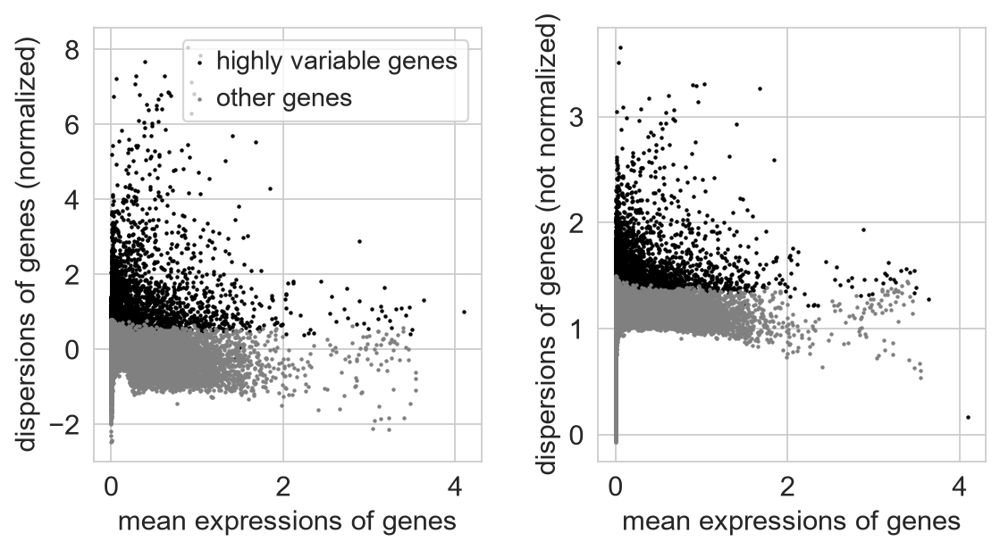

In [13]:
# Visualize highly variable genes
sc.pl.highly_variable_genes(adata_integrated, show=True)

### 2.3 Scaling and PCA

In [14]:
# Save normalized log data before scaling
adata_integrated.layers["normlog"] = adata_integrated.X.copy()

# Scale the data (z-score normalization per gene)
sc.pp.scale(adata_integrated, max_value=10)

In [15]:
print("\n" + "="*80)
print("PCA COMPUTATION")
print("="*80)

# Compute PCA using highly variable genes
sc.tl.pca(
    adata_integrated,
    n_comps=50,
    use_highly_variable=True,
    svd_solver='arpack'
)

# Calculate variance explained
variance_ratio = adata_integrated.uns['pca']['variance_ratio']
print(f"\nVariance explained by first 10 PCs: {100 * variance_ratio[:10].sum():.2f}%")
print(f"Variance explained by first 30 PCs: {100 * variance_ratio[:30].sum():.2f}%")


PCA COMPUTATION
computing PCA
    with n_comps=50
    finished (0:00:09)

Variance explained by first 10 PCs: 13.07%
Variance explained by first 30 PCs: 15.78%


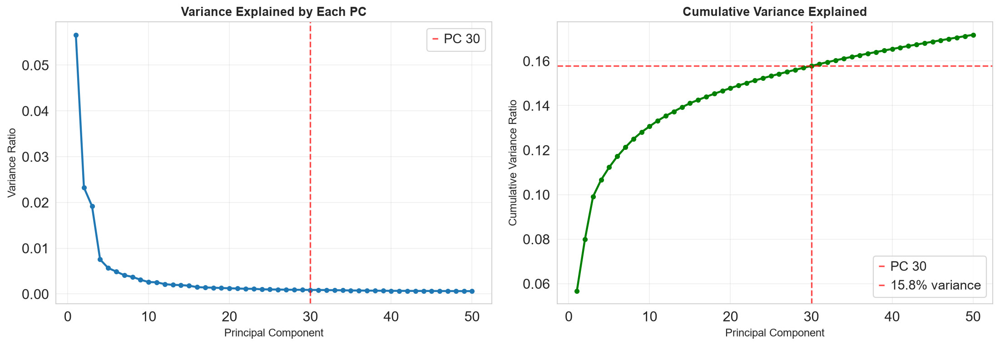

In [16]:
# Elbow plot to determine optimal number of PCs
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Variance ratio plot
axes[0].plot(range(1, 51), adata_integrated.uns['pca']['variance_ratio'], 'o-', linewidth=2, markersize=4)
axes[0].axvline(x=30, color='red', linestyle='--', alpha=0.7, label='PC 30')
axes[0].set_xlabel('Principal Component', fontsize=11)
axes[0].set_ylabel('Variance Ratio', fontsize=11)
axes[0].set_title('Variance Explained by Each PC', fontsize=12, fontweight='bold')
axes[0].legend()
axes[0].grid(True, alpha=0.3)

# Cumulative variance plot
cumsum_var = np.cumsum(adata_integrated.uns['pca']['variance_ratio'])
axes[1].plot(range(1, 51), cumsum_var, 'o-', linewidth=2, markersize=4, color='green')
axes[1].axvline(x=30, color='red', linestyle='--', alpha=0.7, label='PC 30')
axes[1].axhline(y=cumsum_var[29], color='red', linestyle='--', alpha=0.7,
                label=f'{100*cumsum_var[29]:.1f}% variance')
axes[1].set_xlabel('Principal Component', fontsize=11)
axes[1].set_ylabel('Cumulative Variance Ratio', fontsize=11)
axes[1].set_title('Cumulative Variance Explained', fontsize=12, fontweight='bold')
axes[1].legend()
axes[1].grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

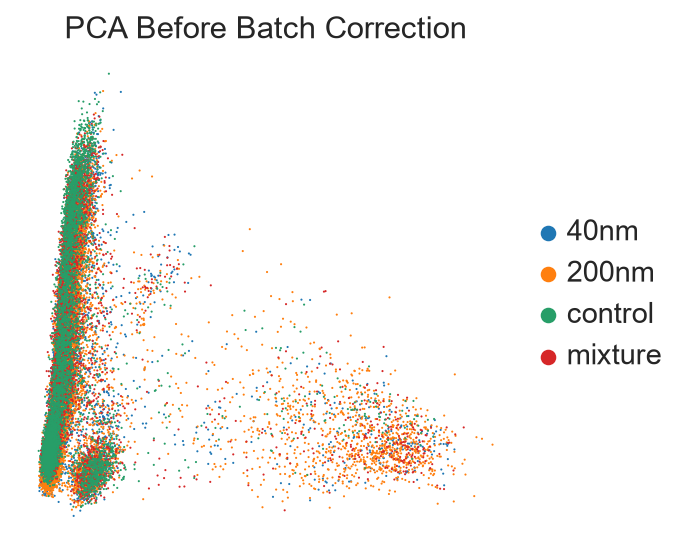

In [17]:
# Visualize PCA colored by sample (before batch correction)
sc.pl.pca(adata_integrated, color='sample', title='PCA Before Batch Correction')

### 2.4 Batch Correction

In [18]:
print("BATCH CORRECTION (Harmony)")
print("="*80)

# Apply Harmony batch correction on PCA representation
sce.pp.harmony_integrate(
    adata_integrated,
    key='sample',
    basis='X_pca',
    adjusted_basis='X_pca_harmony'
)

2026-09-01 14:36:39,247 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...


BATCH CORRECTION (Harmony)


2026-09-01 14:36:40,795 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-09-01 14:36:40,886 - harmonypy - INFO - Iteration 1 of 10
2026-09-01 14:36:45,585 - harmonypy - INFO - Iteration 2 of 10
2026-09-01 14:36:50,239 - harmonypy - INFO - Iteration 3 of 10
2026-09-01 14:36:54,891 - harmonypy - INFO - Iteration 4 of 10
2026-09-01 14:36:59,464 - harmonypy - INFO - Iteration 5 of 10
2026-09-01 14:37:04,132 - harmonypy - INFO - Iteration 6 of 10
2026-09-01 14:37:06,657 - harmonypy - INFO - Iteration 7 of 10
2026-09-01 14:37:08,552 - harmonypy - INFO - Iteration 8 of 10
2026-09-01 14:37:10,444 - harmonypy - INFO - Converged after 8 iterations


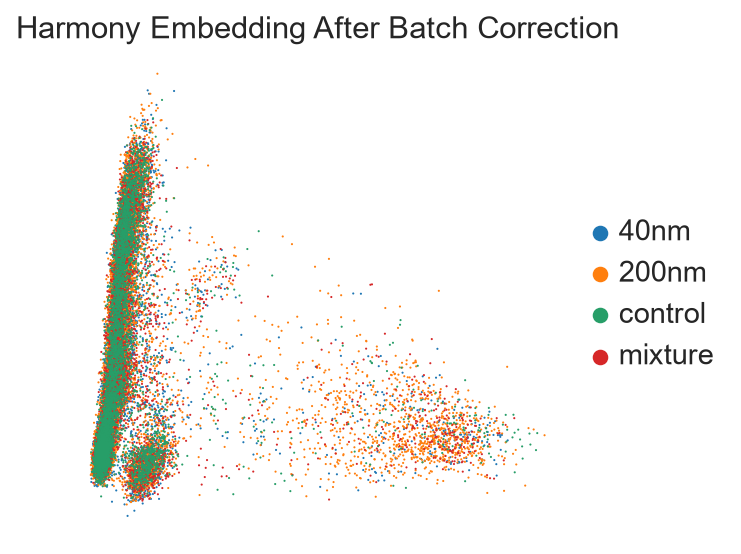

In [19]:
# Visualize Harmony representation colored by sample (after batch correction)
sc.pl.embedding(
    adata_integrated,
    basis='X_pca_harmony',
    color='sample',
    title='Harmony Embedding After Batch Correction'
)

### 2.5 Neighborhood Graph and UMAP

In [20]:
print("\n" + "="*80)
print("NEIGHBORHOOD GRAPH")
print("="*80)

# Compute neighborhood graph
sc.pp.neighbors(
    adata_integrated,
    n_neighbors=15,
    n_pcs=40,
    use_rep='X_pca_harmony',
    metric='cosine'
)


NEIGHBORHOOD GRAPH
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)


In [21]:
print("\n" + "="*80)
print("UMAP EMBEDDING")
print("="*80)

# Compute UMAP embedding
sc.tl.umap(
    adata_integrated,
    min_dist=0.4,
    spread=1.0,
    n_components=2,
    random_state=42
)


UMAP EMBEDDING
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:09)


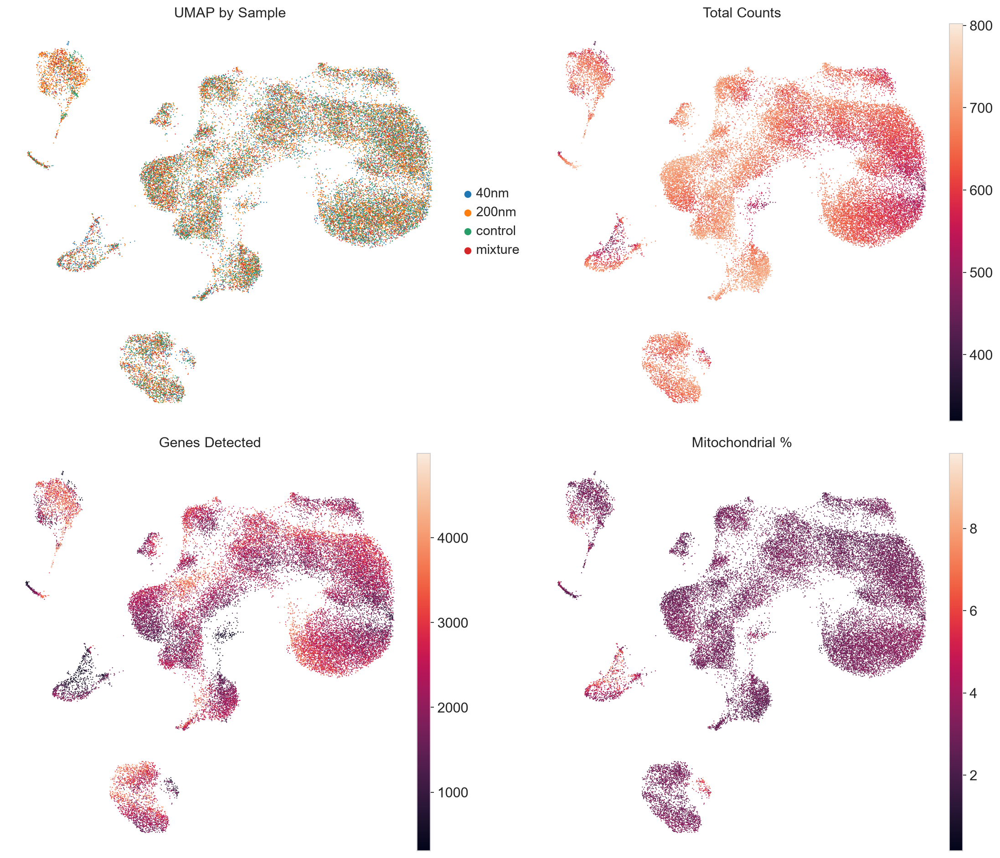

In [22]:
# Visualize UMAP colored by sample and QC metrics
fig, axes = plt.subplots(2, 2, figsize=(14, 12))

sc.pl.umap(adata_integrated, color='sample', ax=axes[0, 0], show=False, title='UMAP by Sample')
sc.pl.umap(adata_integrated, color='total_counts', ax=axes[0, 1], show=False, title='Total Counts')
sc.pl.umap(adata_integrated, color='n_genes_by_counts', ax=axes[1, 0], show=False, title='Genes Detected')
sc.pl.umap(adata_integrated, color='pct_counts_mt', ax=axes[1, 1], show=False, title='Mitochondrial %')

plt.tight_layout()
plt.show()

### 2.6 Leiden Clustering

In [23]:
print("\n" + "="*80)
print("LEIDEN CLUSTERING")
print("="*80)

# Leiden clustering
sc.tl.leiden(
    adata_integrated,
    resolution=1.2,
    random_state=42,
    key_added='leiden'
)

# Display cluster sizes
cluster_sizes = adata_integrated.obs['leiden'].value_counts().sort_index()
print(f"\nCluster sizes:")
for cluster, size in cluster_sizes.items():
    pct = 100 * size / adata_integrated.n_obs
    print(f"  Cluster {cluster}: {size:,} cells ({pct:.1f}%)")


LEIDEN CLUSTERING
running Leiden clustering
    finished: found 24 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:05)

Cluster sizes:
  Cluster 0: 3,161 cells (9.5%)
  Cluster 1: 2,992 cells (9.0%)
  Cluster 2: 2,943 cells (8.9%)
  Cluster 3: 2,871 cells (8.7%)
  Cluster 4: 2,519 cells (7.6%)
  Cluster 5: 2,143 cells (6.5%)
  Cluster 6: 1,917 cells (5.8%)
  Cluster 7: 1,833 cells (5.5%)
  Cluster 8: 1,714 cells (5.2%)
  Cluster 9: 1,625 cells (4.9%)
  Cluster 10: 1,456 cells (4.4%)
  Cluster 11: 1,193 cells (3.6%)
  Cluster 12: 1,131 cells (3.4%)
  Cluster 13: 1,067 cells (3.2%)
  Cluster 14: 1,006 cells (3.0%)
  Cluster 15: 925 cells (2.8%)
  Cluster 16: 612 cells (1.8%)
  Cluster 17: 541 cells (1.6%)
  Cluster 18: 366 cells (1.1%)
  Cluster 19: 338 cells (1.0%)
  Cluster 20: 232 cells (0.7%)
  Cluster 21: 222 cells (0.7%)
  Cluster 22: 200 cells (0.6%)
  Cluster 23: 129 cells (0.4%)


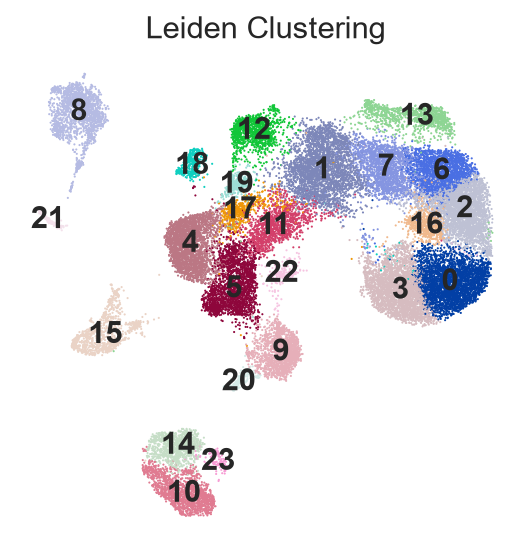

In [24]:
# Visualize Leiden clustering on UMAP
sc.pl.umap(
    adata_integrated,
    color='leiden',
    legend_loc='on data',
    title='Leiden Clustering',
    frameon=False
)

## Task 3: Cell Type Annotation

In this section, we will:
1. Identify marker genes for each cluster
2. Visualize marker gene expression
3. Annotate clusters based on known immune cell markers
4. Validate annotations

### 3.1 Marker Gene Identification

In [25]:
print("\n" + "="*80)
print("MARKER GENE IDENTIFICATION")
print("="*80)

# Find marker genes for Leiden clusters
sc.tl.rank_genes_groups(
    adata_integrated,
    groupby='leiden',
    method='wilcoxon',
    layer="normlog",
    key_added='rank_genes_leiden'
)


MARKER GENE IDENTIFICATION
ranking genes
    finished: added to `.uns['rank_genes_leiden']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:20)


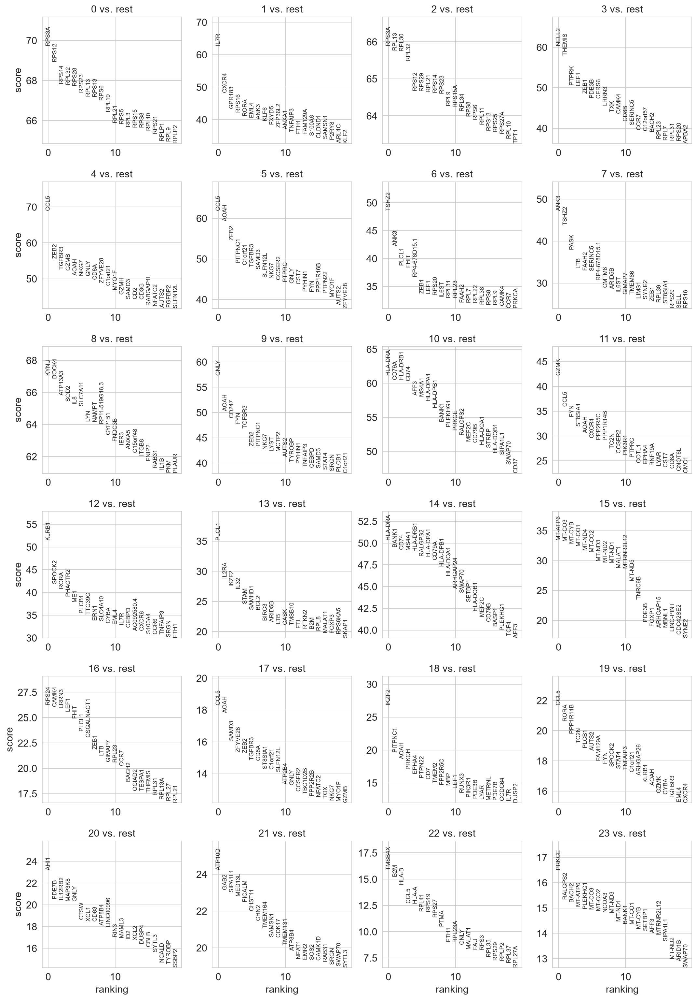

In [26]:
# Overview plot of top marker genes
sc.pl.rank_genes_groups(
    adata_integrated,
    n_genes=20,
    sharey=False,
    key='rank_genes_leiden',
    show=True
)

In [27]:
# Extract marker genes as a DataFrame
marker_genes_df = sc.get.rank_genes_groups_df(
    adata_integrated,
    group=None,
    key='rank_genes_leiden'
)

print("\nTop 5 marker genes per cluster:")
print("="*80)

for cluster in sorted(adata_integrated.obs['leiden'].unique()):
    cluster_markers = marker_genes_df[
        marker_genes_df['group'] == cluster
    ].head(5)

    print(f"\nCluster {cluster}:")
    for idx, row in cluster_markers.iterrows():
        print(f"  {row['names']:15s} | score: {row['scores']:6.2f} | "
              f"logFC: {row['logfoldchanges']:6.2f} | p-val: {row['pvals']:.2e}")


Top 5 marker genes per cluster:

Cluster 0:
  RPS3A           | score:  69.72 | logFC:   0.90 | p-val: 0.00e+00
  RPS12           | score:  68.91 | logFC:   0.82 | p-val: 0.00e+00
  RPS14           | score:  67.82 | logFC:   0.81 | p-val: 0.00e+00
  RPL32           | score:  67.77 | logFC:   0.89 | p-val: 0.00e+00
  RPS28           | score:  67.71 | logFC:   0.81 | p-val: 0.00e+00

Cluster 1:
  IL7R            | score:  62.63 | logFC:   1.93 | p-val: 0.00e+00
  CXCR4           | score:  48.20 | logFC:   1.56 | p-val: 0.00e+00
  GPR183          | score:  43.26 | logFC:   2.24 | p-val: 0.00e+00
  RPS16           | score:  42.07 | logFC:   0.69 | p-val: 0.00e+00
  RORA            | score:  40.99 | logFC:   1.42 | p-val: 0.00e+00

Cluster 10:
  HLA-DRA         | score:  61.09 | logFC:   6.23 | p-val: 0.00e+00
  CD79A           | score:  60.46 | logFC:   6.61 | p-val: 0.00e+00
  HLA-DRB1        | score:  60.41 | logFC:   5.88 | p-val: 0.00e+00
  CD74            | score:  60.29 | logFC:   3

    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden']`


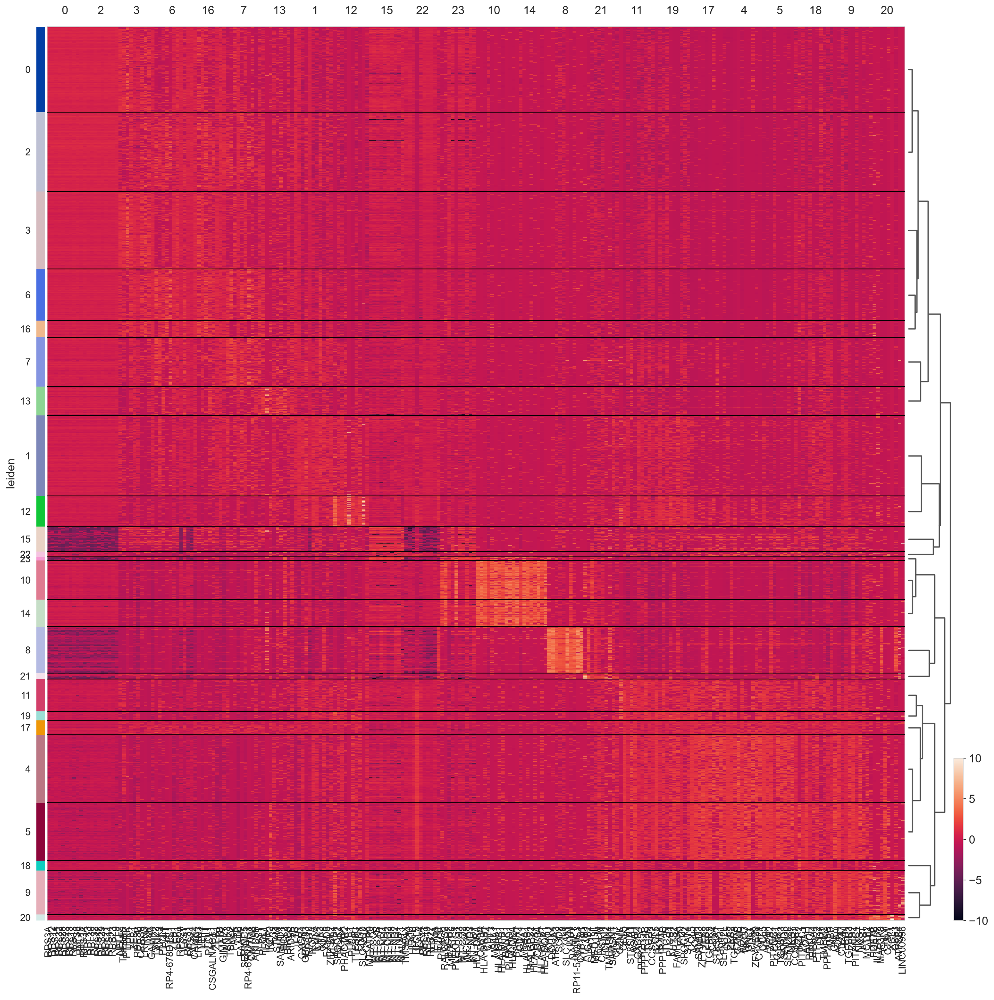

In [28]:
# Heatmap of top marker genes
sc.pl.rank_genes_groups_heatmap(
    adata_integrated,
    n_genes=10,
    key='rank_genes_leiden',
    groupby='leiden',
    show_gene_labels=True,
    figsize=(20, 20),
    dendrogram=True,
    show=True
)

### 3.2 Cell Type Annotation

Based on the marker genes, we'll annotate clusters with known immune cell types.

**Common immune cell markers:**
- **T cells**: CD3D, CD3E, CD3G
- **B cells**: CD79A, CD79B, MS4A1 (CD20)
- **NK cells**: NKG7, GNLY, KLRD1
- **Monocytes/Macrophages**: CD14, CD68, LYZ, FCGR3A (CD16)
- **Dendritic cells**: CD1C, FCER1A, CLEC9A
- **Neutrophils**: S100A8, S100A9, CSF3R
- **Plasma cells**: IGHA1, IGHG1, MZB1

In [29]:
# Define key immune cell markers
marker_genes = {
    'T_cells': ['CD3D', 'CD3E', 'CD3G'],
    'CD4_T_cells': ['CD4', 'IL7R'],
    'CD8_T_cells': ['CD8A', 'CD8B'],
    'NK_cells': ['NKG7', 'GNLY', 'KLRD1', 'KLRF1', 'NCAM1', 'FCGR3A', 'TYROBP'],
    'B_cells': ['CD79A', 'CD79B', 'MS4A1'],
    'Monocytes_Macrophages': ['CD14', 'CD68', 'LYZ', 'FCGR3A'],
    'Dendritic_cells': ['CD1C', 'FCER1A', 'CLEC9A'],
    'Neutrophils': ['S100A8', 'S100A9', 'CSF3R'],
    'Plasma_cells': ['IGHA1', 'IGHG1', 'MZB1']
}

# Check which markers are present in the dataset
available_markers = {}
for cell_type, genes in marker_genes.items():
    available = [g for g in genes if g in adata_integrated.var_names]
    if available:
        available_markers[cell_type] = available

print("Available marker genes:")
for cell_type, genes in available_markers.items():
    print(f"  {cell_type}: {', '.join(genes)}")

Available marker genes:
  T_cells: CD3D, CD3E, CD3G
  CD4_T_cells: CD4, IL7R
  CD8_T_cells: CD8A, CD8B
  NK_cells: NKG7, GNLY, KLRD1, KLRF1, NCAM1, FCGR3A, TYROBP
  B_cells: CD79A, CD79B, MS4A1
  Monocytes_Macrophages: CD14, CD68, LYZ, FCGR3A
  Dendritic_cells: CD1C, FCER1A, CLEC9A
  Neutrophils: S100A8, S100A9, CSF3R
  Plasma_cells: MZB1


In [30]:
# Compute signature module scores to separate T cells vs NK cells
t_cell_markers = [g for g in ['CD3D', 'CD3E', 'CD3G', 'TRAC'] if g in adata_integrated.var_names]
nk_cell_markers = [g for g in ['KLRD1', 'KLRF1', 'NCAM1', 'FCGR3A', 'TYROBP', 'FCER1G'] if g in adata_integrated.var_names]

if t_cell_markers:
    sc.tl.score_genes(adata_integrated, gene_list=t_cell_markers, score_name='T_cell_score', layer='normlog')
if nk_cell_markers:
    sc.tl.score_genes(adata_integrated, gene_list=nk_cell_markers, score_name='NK_cell_score', layer='normlog')

computing score 'T_cell_score'
    finished: added
    'T_cell_score', score of gene set (adata.obs).
    50 total control genes are used. (0:00:00)
computing score 'NK_cell_score'
    finished: added
    'NK_cell_score', score of gene set (adata.obs).
    250 total control genes are used. (0:00:00)


In [70]:
# Compute signature module scores to separate CD4+ vs CD8+ T cells
cd4_markers = [g for g in ['CD4', 'IL7R', 'CD40LG'] if g in adata_integrated.var_names]
cd8_markers = [g for g in ['CD8A', 'CD8B', 'GZMK'] if g in adata_integrated.var_names]

sc.tl.score_genes(adata_integrated, gene_list=cd4_markers, score_name='CD4_score', layer='normlog')
sc.tl.score_genes(adata_integrated, gene_list=cd8_markers, score_name='CD8_score', layer='normlog')

# Display median scores for each cluster
adata_integrated.obs.groupby('leiden')[['CD4_score', 'CD8_score']].median()

computing score 'CD4_score'
    finished: added
    'CD4_score', score of gene set (adata.obs).
    150 total control genes are used. (0:00:00)
computing score 'CD8_score'
    finished: added
    'CD8_score', score of gene set (adata.obs).
    100 total control genes are used. (0:00:00)


,CD4_score,CD8_score
leiden,,
0,0.238112,0.240952
1,0.456847,-0.235479
2,0.241196,-0.244294
3,0.181570,0.166349
4,-0.282475,0.439886
5,-0.432170,0.126357
6,0.238575,-0.283291
7,0.355039,-0.275418
8,-0.308709,-0.315562


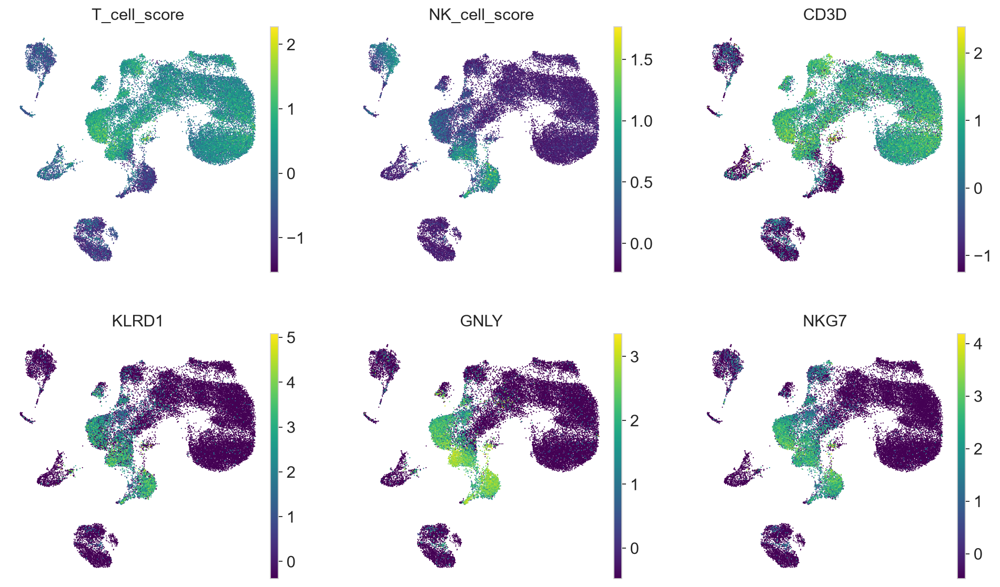

In [69]:
# Visualize marker gene expression and T/NK module scores on UMAP
score_and_markers = [g for g in ['T_cell_score', 'NK_cell_score', 'CD3D', 'KLRD1', 'GNLY', 'NKG7'] if g in adata_integrated.obs.columns or g in adata_integrated.var_names]

if score_and_markers:
    sc.pl.umap(
        adata_integrated,
        color=score_and_markers,
        ncols=3,
        frameon=False,
        cmap='viridis'
    )

categories: 0, 1, 2, etc.
var_group_labels: T_cells, CD4_T_cells, CD8_T_cells, etc.


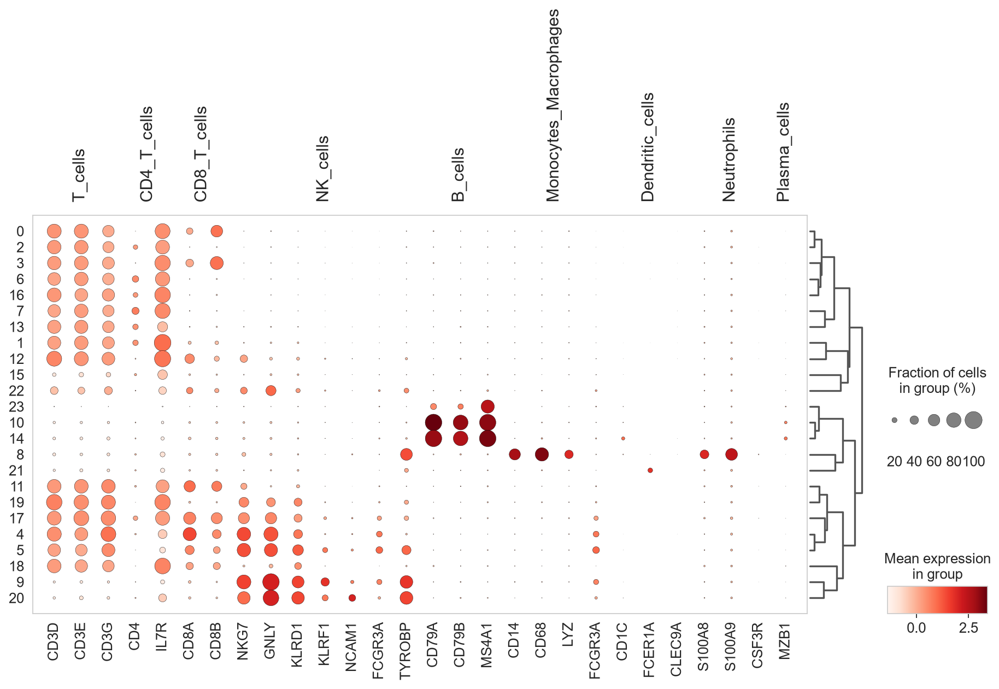

In [32]:
# Dot plot of marker genes
if available_markers:
    sc.pl.dotplot(
        adata_integrated,
        var_names=available_markers,
        groupby='leiden',
        figsize=(14, 6),
        dendrogram=True
    )

In [71]:
# Manual marker-gene-based cluster identity
cell_type_annotations_manual = {
    '0': 'T cells',
    '2': 'T cells',
    '3': 'T cells',
    '6': 'T cells',
    '16': 'T cells',
    '7': 'T cells',
    '13': 'T cells',
    '1': 'T cells',
    '12': 'T cells',
    '15': 'T cells',
    '22': 'T cells',
    '23': 'B cells',
    '10': 'B cells',
    '14': 'B cells',
    '8': 'Monocytes and Macrophages, and Neutrophils',
    '21': 'Dendritic cells',
    '11': 'T cells',
    '19': 'T cells',
    '17': 'T cells',
    '4': 'T cells',
    '5': 'T cells',
    '18': 'T cells',
    '9': 'NK cells',
    '20': 'NK cells'
}

# Split generic 'T cells' clusters into CD4+ / CD8+ using the CD4_score / CD8_score computed earlier
cd4_cd8_medians = adata_integrated.obs.groupby('leiden')[['CD4_score', 'CD8_score']].median()

for cluster, label in list(cell_type_annotations_manual.items()):
    if label == 'T cells' and cluster in cd4_cd8_medians.index:
        cd4_med, cd8_med = cd4_cd8_medians.loc[cluster, ['CD4_score', 'CD8_score']]
        cell_type_annotations_manual[cluster] = 'CD4+ T cells' if cd4_med >= cd8_med else 'CD8+ T cells'

print("\nRefined T cell subtype calls:")
for cluster, label in sorted(cell_type_annotations_manual.items(), key=lambda x: int(x[0])):
    if 'T cells' in label:
        print(f"  Cluster {cluster:>3s}: {label}")

# Add cell type annotations to the data
adata_integrated.obs['cell_type_manual'] = adata_integrated.obs['leiden'].map(cell_type_annotations_manual)

print("\nManual marker-gene-based cluster identity (reference only):")
print(adata_integrated.obs['cell_type_manual'].value_counts())

# =============================================================================
# Azimuth PBMC Reference Annotation (panhumanpy Azimuth Neural Network)
# =============================================================================

print("\n" + "="*80)
print("AZIMUTH NEURAL NETWORK ANNOTATION (panhumanpy)")
print("="*80)

query_raw = ad.AnnData(
    X=adata_integrated.layers['counts'].copy(),
    obs=adata_integrated.obs.copy(),
    var=adata_integrated.var.copy()
)
query_raw.var_names = adata_integrated.var_names
query_raw.X = np.round(query_raw.X)

# Run inference against the Azimuth PBMC reference 
azimuth = ph.AzimuthNN(
    query_raw,
    annotation_pipeline='supervised',
    model_version='v1',
    output_mode='minimal',
    refine=['broad', 'medium', 'fine']
)

azimuth_meta = azimuth.cells_meta
azimuth_meta.index = query_raw.obs_names

print(f"\nAzimuth annotation complete for {azimuth_meta.shape[0]:,} cells")

# Attach per-cell Azimuth annotations to the integrated AnnData
for col in ['full_hierarchical_labels', 'azimuth_broad', 'azimuth_medium',
            'azimuth_fine', 'final_level_confidence']:
    if col in azimuth_meta.columns:
        adata_integrated.obs[col] = azimuth_meta.loc[adata_integrated.obs_names, col].values

def simplify_azimuth_lineage(full_label):
    if not isinstance(full_label, str) or full_label == 'Unassigned':
        return 'Unassigned'
    segments = full_label.split('|')
    if 'CD8 T cell' in segments:
        return 'CD8+ T cells'
    if 'CD4 T cell' in segments:
        return 'CD4+ T cells'
    if 'T cell' in segments:
        return 'T cells'
    if 'NK cell' in segments:
        return 'NK cells'
    if 'B cell' in segments:
        return 'B cells'
    if 'Monocyte' in segments or 'Monocyte/DC' in segments:
        return 'Monocytes'
    if 'Macrophage' in segments:
        return 'Macrophages'
    if 'Dendritic cell' in segments:
        return 'Dendritic cells'
    if 'Granulocyte' in segments:
        return 'Granulocytes'
    if 'Platelet' in segments:
        return 'Platelets'
    if 'Red blood cell' in segments or 'Erythroblast' in segments:
        return 'Erythroid cells'
    if segments[0] == 'Immune cell':
        return 'Other immune cells'
    return 'Non-immune cells'

adata_integrated.obs['azimuth_lineage'] = (
    adata_integrated.obs['full_hierarchical_labels'].apply(simplify_azimuth_lineage)
)

print("\nAzimuth-derived immune lineage distribution (per cell):")
print(adata_integrated.obs['azimuth_lineage'].value_counts())

# =============================================================================
# Consensus Cell Type Labels: Leiden clusters + Azimuth reference + marker genes
# =============================================================================

print("\n" + "="*80)
print("CLUSTER-LEVEL CONSENSUS: LEIDEN + AZIMUTH + MARKER GENES")
print("="*80)

# For each Leiden cluster, compute the dominant Azimuth lineage
cluster_to_azimuth = (
    adata_integrated.obs[adata_integrated.obs['azimuth_lineage'] != 'Unassigned']
    .groupby('leiden')['azimuth_lineage']
    .agg(lambda x: x.value_counts().idxmax() if len(x) > 0 else 'Unassigned')
)
cluster_to_azimuth = cluster_to_azimuth.reindex(
    adata_integrated.obs['leiden'].cat.categories, fill_value='Unassigned'
)

# A cluster-specific override to avoid over-generalized Azimuth labels
manual_cluster_types = pd.Series(cell_type_annotations_manual)
cluster_to_final = cluster_to_azimuth.copy()

for cluster, manual_label in manual_cluster_types.items():
    if cluster not in cluster_to_final.index:
        continue

    azimuth_label = cluster_to_final.loc[cluster]

    if azimuth_label == 'Unassigned':
        cluster_to_final.loc[cluster] = manual_label
        continue

    broad_to_specific = {
        'T cells': {'CD8+ T cells', 'CD4+ T cells'},
        'Other immune cells': {'B cells', 'NK cells', 'Dendritic cells', 'Monocytes', 'Monocytes', 'Granulocytes'},
        'Monocytes': {'Monocytes', 'Macrophages'},
        'Macrophages': {'Monocytes', 'Macrophages'},
    }

    if manual_label in {'CD8+ T cells', 'CD4+ T cells', 'B cells', 'NK cells', 'Dendritic cells'}:
        if azimuth_label in {'T cells', 'Other immune cells'}:
            cluster_to_final.loc[cluster] = manual_label
            continue

    if azimuth_label in broad_to_specific and manual_label in broad_to_specific[azimuth_label]:
        cluster_to_final.loc[cluster] = manual_label

print("\nCluster -> Azimuth majority cell type (with within-cluster agreement):")
for cluster, cell_type in cluster_to_azimuth.items():
    cluster_cells = adata_integrated.obs[adata_integrated.obs['leiden'] == cluster]
    agreement = (cluster_cells['azimuth_lineage'] == cell_type).mean() * 100
    print(f"  Cluster {cluster:>3s}: {cell_type:20s} (agreement: {agreement:.1f}%)")

print("\nCluster -> final consolidated cell type:")
for cluster, cell_type in cluster_to_final.items():
    print(f"  Cluster {cluster:>3s}: {cell_type}")

# Final cell type labels come from the consensus of Azimuth and marker-based annotations
adata_integrated.obs['cell_type'] = adata_integrated.obs['leiden'].map(cluster_to_final)

print("\nFinal cell type annotations (Azimuth + Leiden consensus):")
print(adata_integrated.obs['cell_type'].value_counts())


Refined T cell subtype calls:
  Cluster   0: CD8+ T cells
  Cluster   1: CD4+ T cells
  Cluster   2: CD4+ T cells
  Cluster   3: CD4+ T cells
  Cluster   4: CD8+ T cells
  Cluster   5: CD8+ T cells
  Cluster   6: CD4+ T cells
  Cluster   7: CD4+ T cells
  Cluster  11: CD8+ T cells
  Cluster  12: CD4+ T cells
  Cluster  13: CD4+ T cells
  Cluster  15: CD4+ T cells
  Cluster  16: CD4+ T cells
  Cluster  17: CD8+ T cells
  Cluster  18: CD4+ T cells
  Cluster  19: CD4+ T cells
  Cluster  22: CD8+ T cells

Manual marker-gene-based cluster identity (reference only):
cell_type_manual
CD4+ T cells                                  16995
CD8+ T cells                                   9757
B cells                                        2591
NK cells                                       1857
Monocytes and Macrophages, and Neutrophils     1714
Dendritic cells                                 222
Name: count, dtype: int64

AZIMUTH NEURAL NETWORK ANNOTATION (panhumanpy)
Integer counts detected by pa


Manual marker-gene identity vs final consensus per cluster:
                           manual_marker_based  final_consensus
0                                 CD8+ T cells     CD4+ T cells
1                                 CD4+ T cells     CD4+ T cells
2                                 CD4+ T cells     CD4+ T cells
3                                 CD4+ T cells     CD4+ T cells
4                                 CD8+ T cells     CD8+ T cells
5                                 CD8+ T cells     CD8+ T cells
6                                 CD4+ T cells     CD4+ T cells
7                                 CD4+ T cells     CD4+ T cells
8   Monocytes and Macrophages, and Neutrophils        Monocytes
9                                     NK cells     CD8+ T cells
10                                     B cells          B cells
11                                CD8+ T cells     CD4+ T cells
12                                CD4+ T cells     CD4+ T cells
13                                CD4+ T ce

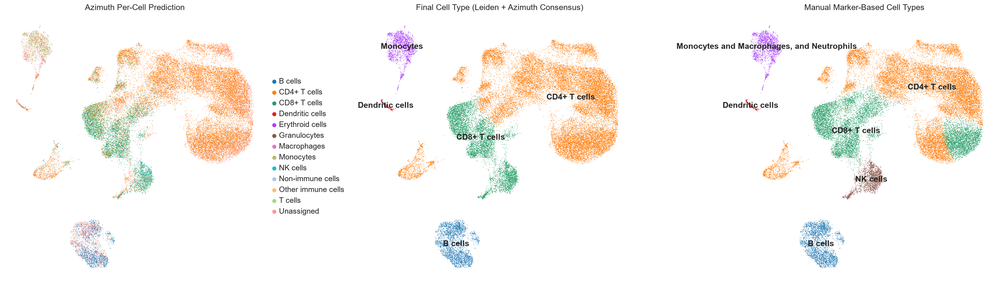

In [72]:
# Compare the manual marker-gene calls against the final consensus labels
print("\nManual marker-gene identity vs final consensus per cluster:")
manual_vs_azimuth = pd.DataFrame({
    'manual_marker_based': manual_cluster_types,
    'final_consensus': cluster_to_final
}).reindex(adata_integrated.obs['leiden'].cat.categories)
print(manual_vs_azimuth)

# Visualize per-cell Azimuth predictions, the final consensus labels,
# and the manual marker-based annotations side-by-side.
fig, axes = plt.subplots(1, 3, figsize=(24, 7))
sc.pl.umap(adata_integrated, color='azimuth_lineage', ax=axes[0], show=False,
           title='Azimuth Per-Cell Prediction', frameon=False)
sc.pl.umap(adata_integrated, color='cell_type', ax=axes[1], show=False,
           title='Final Cell Type (Leiden + Azimuth Consensus)', frameon=False,
           legend_loc='on data')

if 'cell_type_manual' in adata_integrated.obs.columns:
    sc.pl.umap(adata_integrated, color='cell_type_manual', ax=axes[2], show=False,
               title='Manual Marker-Based Cell Types', frameon=False,
               legend_loc='on data')
else:
    axes[2].axis('off')
    axes[2].text(0.5, 0.5, 'Manual label unavailable', ha='center', va='center')
    
plt.tight_layout()
plt.show()

In [73]:
# Use the marker-based cluster assignment for all analyses because of the amount of uncategorized cells in the Azimuth reference.
adata_integrated.obs['cell_type'] = adata_integrated.obs['leiden'].map(cell_type_annotations_manual)

## Task 4: Composition Analysis

In this section, we will:
1. Calculate cell type proportions per sample
2. Visualize composition differences across conditions
3. Perform statistical tests for significant differences
4. Identify cell types that are enriched or depleted upon nanoplastic exposure

### 4.1 Cell Type Proportions

In [74]:
print("\n" + "="*80)
print("COMPOSITION ANALYSIS")
print("="*80)

# Calculate cell type proportions per sample
composition = pd.crosstab(
    adata_integrated.obs['sample'],
    adata_integrated.obs['cell_type'],
    normalize='index'
) * 100

print("\nCell type proportions (%) per sample:")
display(composition.round(2))


COMPOSITION ANALYSIS

Cell type proportions (%) per sample:


cell_type,B cells,CD4+ T cells,CD8+ T cells,Dendritic cells,"Monocytes and Macrophages, and Neutrophils",NK cells
sample,,,,,,
40nm,6.47,56.24,28.41,0.61,2.88,5.40
200nm,7.23,48.68,29.82,0.64,8.19,5.43
control,8.92,51.35,30.45,0.58,2.68,6.03
mixture,9.85,49.52,29.10,0.93,4.78,5.82


In [75]:
# Absolute cell counts
counts = pd.crosstab(
    adata_integrated.obs['sample'],
    adata_integrated.obs['cell_type']
)

print("\nCell type counts per sample:")
display(counts)


Cell type counts per sample:


cell_type,B cells,CD4+ T cells,CD8+ T cells,Dendritic cells,"Monocytes and Macrophages, and Neutrophils",NK cells
sample,,,,,,
40nm,555,4825,2437,52,247,463
200nm,898,6043,3702,79,1017,674
control,553,3185,1889,36,166,374
mixture,585,2942,1729,55,284,346


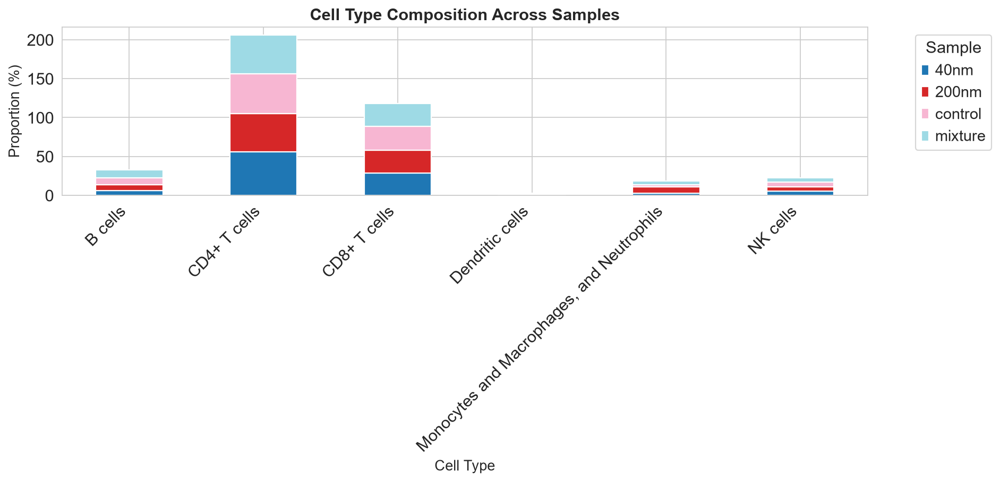

In [76]:
# Stacked bar plot of cell type proportions
fig, ax = plt.subplots(figsize=(12, 6))

composition.T.plot(
    kind='bar',
    stacked=True,
    ax=ax,
    colormap='tab20'
)

ax.set_xlabel('Cell Type', fontsize=12)
ax.set_ylabel('Proportion (%)', fontsize=12)
ax.set_title('Cell Type Composition Across Samples', fontsize=14, fontweight='bold')
ax.legend(title='Sample', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

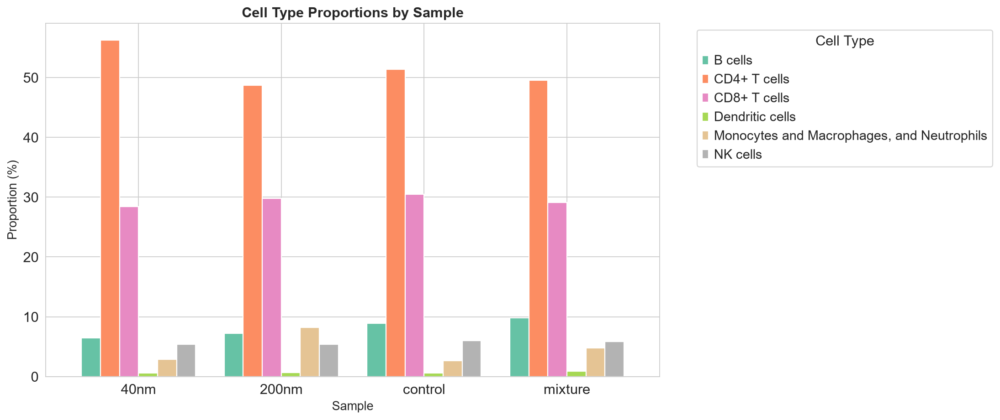

In [77]:
# Grouped bar plot for easier comparison
fig, ax = plt.subplots(figsize=(14, 6))

composition.plot(
    kind='bar',
    ax=ax,
    colormap='Set2',
    width=0.8
)

ax.set_xlabel('Sample', fontsize=12)
ax.set_ylabel('Proportion (%)', fontsize=12)
ax.set_title('Cell Type Proportions by Sample', fontsize=14, fontweight='bold')
ax.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

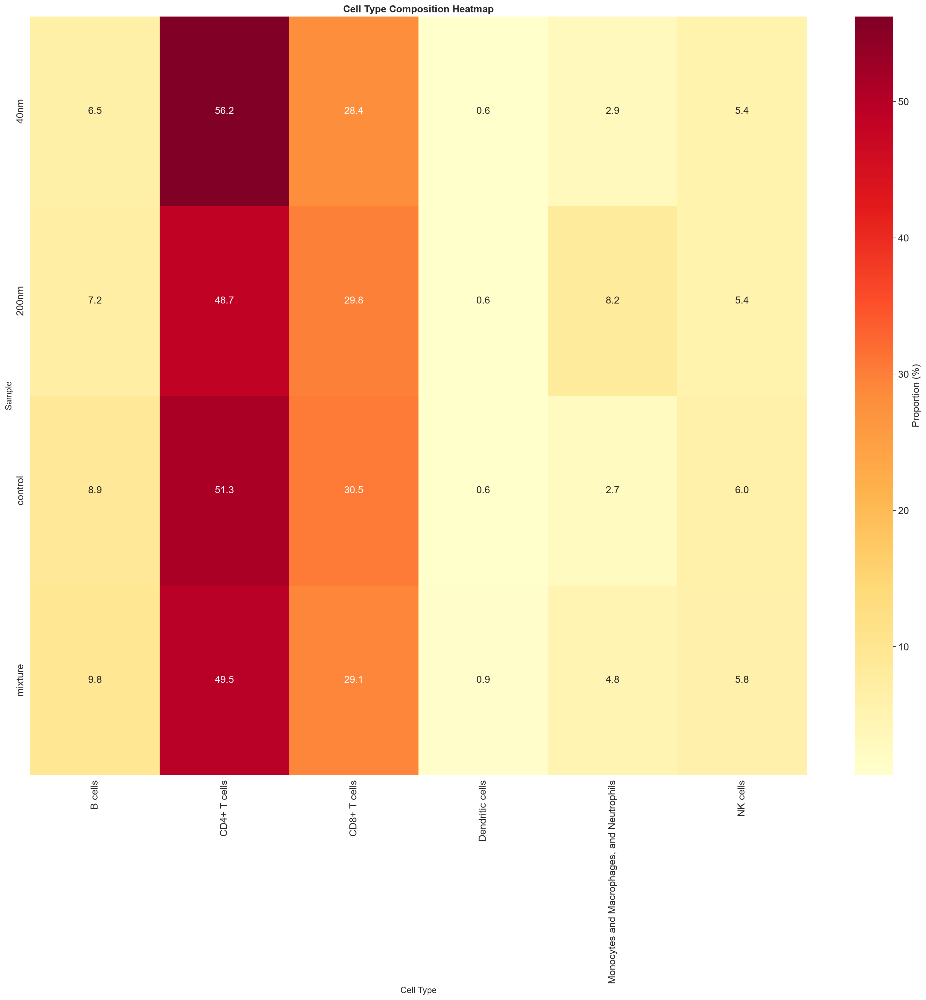

In [78]:
# Heatmap of cell type proportions
fig, ax = plt.subplots(figsize=(20, 20))

sns.heatmap(
    composition,
    annot=True,
    fmt='.1f',
    cmap='YlOrRd',
    cbar_kws={'label': 'Proportion (%)'},
    ax=ax
)

ax.set_xlabel('Cell Type', fontsize=12)
ax.set_ylabel('Sample', fontsize=12)
ax.set_title('Cell Type Composition Heatmap', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### 4.2 Statistical Testing

In [79]:
# Chi-square test for composition differences
from scipy.stats import chi2_contingency

chi2, p_value, dof, expected = chi2_contingency(counts)

print("\nChi-square test for composition differences:")
print(f"  Chi-square statistic: {chi2:.2f}")
print(f"  P-value: {p_value:.2e}")
print(f"  Degrees of freedom: {dof}")

if p_value < 0.05:
    print("Significant differences in cell type composition across samples (p < 0.05)")
else:
    print("No significant differences in cell type composition (p ≥ 0.05)")


Chi-square test for composition differences:
  Chi-square statistic: 527.20
  P-value: 9.86e-103
  Degrees of freedom: 15
Significant differences in cell type composition across samples (p < 0.05)


In [80]:
# Compare each treatment to control using Fisher's exact test
from scipy.stats import fisher_exact

print("\n" + "="*80)
print("PAIRWISE COMPARISONS WITH CONTROL")
print("="*80)

control_counts = counts.loc['control']
results = []

for treatment in ['40nm', '200nm', 'mixture']:
    treatment_counts = counts.loc[treatment]
    
    print(f"\n{treatment.upper()} vs CONTROL:")
    print("-" * 60)
    
    for cell_type in counts.columns:
        # Create 2x2 contingency table
        contingency = [
            [treatment_counts[cell_type], treatment_counts.sum() - treatment_counts[cell_type]],
            [control_counts[cell_type], control_counts.sum() - control_counts[cell_type]]
        ]
        
        # Fisher's exact test
        odds_ratio, p_val = fisher_exact(contingency)
        
        # Calculate fold change
        treatment_prop = composition.loc[treatment, cell_type]
        control_prop = composition.loc['control', cell_type]
        fold_change = treatment_prop / control_prop if control_prop > 0 else np.inf
        
        results.append({
            'Comparison': f'{treatment} vs control',
            'Cell Type': cell_type,
            'Treatment %': treatment_prop,
            'Control %': control_prop,
            'Fold Change': fold_change,
            'Odds Ratio': odds_ratio,
            'P-value': p_val
        })
        
        significance = '***' if p_val < 0.001 else '**' if p_val < 0.01 else '*' if p_val < 0.05 else 'ns'
        print(f"  {cell_type:30s} | FC: {fold_change:5.2f} | OR: {odds_ratio:6.2f} | p: {p_val:.2e} {significance}")

# Create results DataFrame and apply Benjamini-Hochberg FDR correction
results_df = pd.DataFrame(results)
results_df['P-adj'] = multipletests(results_df['P-value'], method='fdr_bh')[1]
results_df['Significant'] = results_df['P-adj'] < 0.05


PAIRWISE COMPARISONS WITH CONTROL

40NM vs CONTROL:
------------------------------------------------------------
  B cells                        | FC:  0.73 | OR:   0.71 | p: 3.44e-08 ***
  CD4+ T cells                   | FC:  1.10 | OR:   1.22 | p: 3.90e-09 ***
  CD8+ T cells                   | FC:  0.93 | OR:   0.91 | p: 7.10e-03 **
  Dendritic cells                | FC:  1.04 | OR:   1.04 | p: 9.14e-01 ns
  Monocytes and Macrophages, and Neutrophils | FC:  1.08 | OR:   1.08 | p: 4.79e-01 ns
  NK cells                       | FC:  0.90 | OR:   0.89 | p: 1.05e-01 ns

200NM vs CONTROL:
------------------------------------------------------------
  B cells                        | FC:  0.81 | OR:   0.80 | p: 7.00e-05 ***
  CD4+ T cells                   | FC:  0.95 | OR:   0.90 | p: 6.24e-04 ***
  CD8+ T cells                   | FC:  0.98 | OR:   0.97 | p: 3.78e-01 ns
  Dendritic cells                | FC:  1.10 | OR:   1.10 | p: 6.92e-01 ns
  Monocytes and Macrophages, and Neutrop

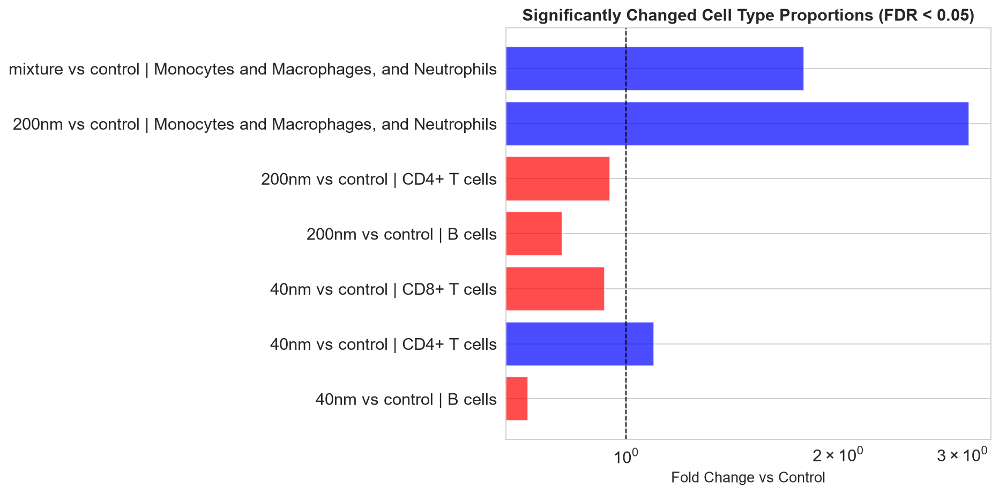

Significant changes plot generated

7 significant changes detected (FDR adjusted p < 0.05)


In [81]:
# Visualize significantly changed cell types
sig_results = results_df[results_df['Significant']].copy()

if len(sig_results) > 0:
    fig, ax = plt.subplots(figsize=(12, max(6, len(sig_results) * 0.3)))
    
    # Create labels
    sig_results['label'] = sig_results['Comparison'] + ' | ' + sig_results['Cell Type']
    
    # Plot fold changes
    colors = ['red' if fc < 1 else 'blue' for fc in sig_results['Fold Change']]
    ax.barh(sig_results['label'], sig_results['Fold Change'], color=colors, alpha=0.7)
    
    ax.axvline(x=1, color='black', linestyle='--', linewidth=1)
    ax.set_xlabel('Fold Change vs Control', fontsize=12)
    ax.set_title('Significantly Changed Cell Type Proportions (FDR < 0.05)', fontsize=14, fontweight='bold')
    ax.set_xscale('log')
    
    plt.tight_layout()
    plt.show()
    
    print("Significant changes plot generated")
    print(f"\n{len(sig_results)} significant changes detected (FDR adjusted p < 0.05)")
else:
    print("No significant changes in cell type proportions detected")

## Task 5: Differential Expression

In this section, we will:
1. Identify differentially expressed genes between treatment and control
2. Perform cell type-specific differential expression
3. Visualize top differentially expressed genes
4. Perform pathway enrichment analysis (if applicable)

### 5.1 Global Differential Expression

In [82]:
print("\n" + "="*80)
print("DIFFERENTIAL EXPRESSION ANALYSIS (Treatment vs Control)")
print("="*80)

# Ensure sample column is categorical for rank_genes_groups
adata_integrated.obs['sample'] = adata_integrated.obs['sample'].astype('category')

# Compare each treatment directly to control (all cell types combined)
for treatment in ['40nm', '200nm', 'mixture']:
    print(f"\nComparing {treatment.upper()} vs CONTROL...")
    
    # Run differential expression with control as exact reference directly on adata_integrated
    sc.tl.rank_genes_groups(
        adata_integrated,
        groupby='sample',
        groups=[treatment],
        reference='control',
        method='wilcoxon',
        layer='normlog',
        key_added=f'de_{treatment}_vs_control'
    )


DIFFERENTIAL EXPRESSION ANALYSIS (Treatment vs Control)

Comparing 40NM vs CONTROL...
ranking genes
    finished: added to `.uns['de_40nm_vs_control']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)

Comparing 200NM vs CONTROL...
ranking genes
    finished: added to `.uns['de_200nm_vs_control']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:12)

Comparing MIXTURE vs CONTROL...
ranking genes
    finished: added to `.uns['de_mixture_vs_control']`
    'name

In [83]:
# Extract and display top DEGs for each comparison
print("\n" + "="*80)
print("TOP DIFFERENTIALLY EXPRESSED GENES")
print("="*80)

for treatment in ['40nm', '200nm', 'mixture']:
    print(f"\n{treatment.upper()} vs CONTROL:")
    print("-" * 80)
    
    # Get DEGs
    degs = sc.get.rank_genes_groups_df(
        adata_integrated,
        group=treatment,
        key=f'de_{treatment}_vs_control'
    )
    
    # Filter for significant genes
    sig_degs = degs[(degs['pvals_adj'] < 0.05) & (abs(degs['logfoldchanges']) > 0.5)]
    
    print(f"\nTotal significant DEGs (padj < 0.05, |logFC| > 0.5): {len(sig_degs)}")
    print(f"  Upregulated: {len(sig_degs[sig_degs['logfoldchanges'] > 0])}")
    print(f"  Downregulated: {len(sig_degs[sig_degs['logfoldchanges'] < 0])}")
    
    print(f"\nTop 10 upregulated genes:")
    display(sig_degs[sig_degs['logfoldchanges'] > 0].head(10)[['names', 'logfoldchanges', 'pvals_adj']])
    
    print(f"\nTop 10 downregulated genes:")
    display(sig_degs[sig_degs['logfoldchanges'] < 0].head(10)[['names', 'logfoldchanges', 'pvals_adj']])


TOP DIFFERENTIALLY EXPRESSED GENES

40NM vs CONTROL:
--------------------------------------------------------------------------------

Total significant DEGs (padj < 0.05, |logFC| > 0.5): 1842
  Upregulated: 198
  Downregulated: 1644

Top 10 upregulated genes:


,names,logfoldchanges,pvals_adj
0,MTRNR2L12,1.757337,0.000000e+00
1,IL8,2.877189,0.000000e+00
2,MT-ATP8,1.765362,0.000000e+00
3,RPS10,0.755100,0.000000e+00
4,AC016831.7,1.647201,0.000000e+00
5,RPL36A,0.944417,0.000000e+00
11,7SK.2,2.264302,5.751059e-302
33,MTRNR2L2,2.437294,8.111192e-190
54,SNORA76,1.175692,3.095683e-134
62,EIF2S2,0.612451,3.035605e-111



Top 10 downregulated genes:


,names,logfoldchanges,pvals_adj
17884,ADAMTS17,-0.946132,0.049215
17909,LINC00926,-0.528949,0.046769
17910,RP11-385F5.4,-0.625740,0.046751
17915,LPHN1,-0.517322,0.046482
17916,TNFAIP8L2,-0.561322,0.046421
17924,LMNA,-0.900987,0.045517
17929,ARSA,-0.636958,0.045122
17937,TEX22,-0.740944,0.044356
17942,ADRB2,-0.861216,0.044011
17953,PIGM,-0.748480,0.042975



200NM vs CONTROL:
--------------------------------------------------------------------------------

Total significant DEGs (padj < 0.05, |logFC| > 0.5): 3132
  Upregulated: 374
  Downregulated: 2758

Top 10 upregulated genes:


,names,logfoldchanges,pvals_adj
0,IL8,3.558292,0.000000e+00
1,MTRNR2L12,1.443711,0.000000e+00
6,SOD2,1.644481,2.497197e-285
8,IL1B,3.354255,4.833603e-257
15,AC016831.7,1.013890,1.252823e-212
20,7SK.2,1.835078,3.181042e-183
21,NEAT1,0.593887,9.580186e-180
25,CXCL5,3.451187,1.933641e-169
33,CCL3,2.374832,4.857379e-155
35,SERPINB2,3.037991,4.263954e-153



Top 10 downregulated genes:


,names,logfoldchanges,pvals_adj
16810,RP11-239H6.2,-0.797133,0.049899
16819,PIPOX,-1.020151,0.048541
16826,RP11-191G24.1,-0.829102,0.047614
16829,LINC00106,-0.526828,0.047464
16836,ESR1,-0.702725,0.047272
16839,SUGCT,-0.521190,0.047233
16843,TNF,-0.642463,0.046799
16851,COL6A2,-0.501543,0.045819
16854,CTD-2162K18.5,-0.527409,0.045642
16857,HHEX,-0.665540,0.045385



MIXTURE vs CONTROL:
--------------------------------------------------------------------------------

Total significant DEGs (padj < 0.05, |logFC| > 0.5): 271
  Upregulated: 115
  Downregulated: 156

Top 10 upregulated genes:


,names,logfoldchanges,pvals_adj
0,MT-ATP8,1.117570,5.098113e-286
2,IL8,1.631541,8.029871e-143
3,AC016831.7,0.920700,4.269298e-142
5,NEAT1,0.619852,7.100462e-137
12,RP11-703M24.5,0.651994,2.904999e-40
13,TNFAIP3,0.543176,7.754480e-38
17,IL1B,1.998152,1.851450e-28
20,RP11-192P3.5,0.718822,6.286941e-25
21,RP11-219B17.1,0.736560,4.300804e-23
31,SOD2,0.586974,3.640265e-16



Top 10 downregulated genes:


,names,logfoldchanges,pvals_adj
21350,MFSD12,-0.549374,0.049406
21399,CBWD6,-0.523886,0.043601
21435,RP11-473M20.7,-0.592063,0.039893
21437,CD9,-0.819632,0.039771
21465,CPT2,-0.548901,0.037064
21473,LPAR5,-0.683132,0.036089
21531,EPHX2,-0.726664,0.032418
21555,AHCY,-0.508065,0.031102
21605,ZNF444,-0.525577,0.027298
21691,ABCD2,-0.517265,0.022029


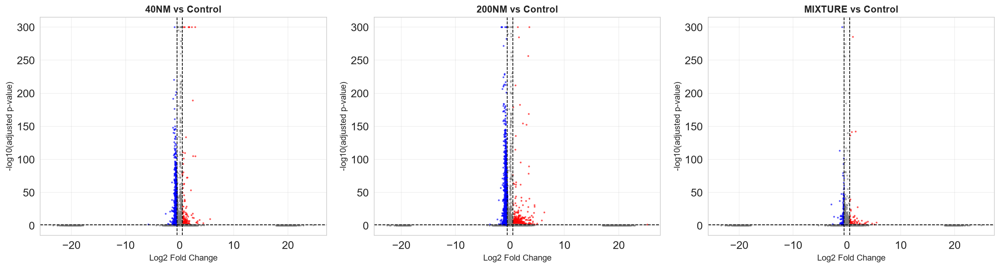

In [84]:
# Volcano plots for each comparison
fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for idx, treatment in enumerate(['40nm', '200nm', 'mixture']):
    ax = axes[idx]
    
    # Get DEGs
    degs = sc.get.rank_genes_groups_df(
        adata_integrated,
        group=treatment,
        key=f'de_{treatment}_vs_control'
    )
    
    # Calculate -log10(p-value)
    degs['-log10_pval'] = -np.log10(degs['pvals_adj'] + 1e-300)
    
    # Color by significance
    colors = []
    for _, row in degs.iterrows():
        if row['pvals_adj'] < 0.05 and row['logfoldchanges'] > 0.5:
            colors.append('red')
        elif row['pvals_adj'] < 0.05 and row['logfoldchanges'] < -0.5:
            colors.append('blue')
        else:
            colors.append('gray')
    
    ax.scatter(degs['logfoldchanges'], degs['-log10_pval'], c=colors, alpha=0.5, s=2)
    
    # Add threshold lines
    ax.axhline(y=-np.log10(0.05), color='black', linestyle='--', linewidth=1)
    ax.axvline(x=0.5, color='black', linestyle='--', linewidth=1)
    ax.axvline(x=-0.5, color='black', linestyle='--', linewidth=1)
    
    ax.set_xlabel('Log2 Fold Change', fontsize=11)
    ax.set_ylabel('-log10(adjusted p-value)', fontsize=11)
    ax.set_title(f'{treatment.upper()} vs Control', fontsize=12, fontweight='bold')
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 5.2 Cell Type-Specific Differential Expression

In [85]:
print("\n" + "="*80)
print("CELL TYPE-SPECIFIC DIFFERENTIAL EXPRESSION")
print("="*80)

# Select most abundant cell types for analysis
cell_type_counts = adata_integrated.obs['cell_type'].value_counts()
abundant_cell_types = cell_type_counts[cell_type_counts > 100].index.tolist()

print(f"\nAnalyzing {len(abundant_cell_types)} abundant cell types (>100 cells)")
print(f"Cell types: {', '.join(abundant_cell_types)}")

# Dictionary to store results
celltype_de_results = {}

for cell_type in abundant_cell_types:
    print(f"\n{cell_type}:")
    celltype_de_results[cell_type] = {}
    
    # Subset to this cell type
    adata_celltype = adata_integrated[adata_integrated.obs['cell_type'] == cell_type].copy()
    
    # Check if we have enough cells in treatment and control
    sample_counts = adata_celltype.obs['sample'].value_counts()
    
    for treatment in ['40nm', '200nm', 'mixture']:
        if treatment in sample_counts and 'control' in sample_counts:
            if sample_counts[treatment] >= 10 and sample_counts['control'] >= 10:
                # Run DE analysis
                adata_celltype.obs['comparison'] = adata_celltype.obs['sample'].apply(
                    lambda x: treatment if x == treatment else 'control' if x == 'control' else 'other'
                )
                
                # Filter out 'other'
                adata_comparison = adata_celltype[adata_celltype.obs['comparison'] != 'other'].copy()
                
                if len(adata_comparison.obs['comparison'].unique()) == 2:
                    sc.tl.rank_genes_groups(
                        adata_comparison,
                        groupby='comparison',
                        groups=[treatment],
                        reference='control',
                        method='wilcoxon',
                        layer='normlog'
                    )
                    
                    degs = sc.get.rank_genes_groups_df(adata_comparison, group=treatment)
                    celltype_de_results[cell_type][treatment] = degs
                    
                    n_sig = len(degs[(degs['pvals_adj'] < 0.05) & (abs(degs['logfoldchanges']) > 0.5)])
                    print(f"  {treatment} vs control: {n_sig} significant DEGs")
            else:
                print(f"  {treatment} vs control: Insufficient cells (need ≥10 in each group)")


CELL TYPE-SPECIFIC DIFFERENTIAL EXPRESSION

Analyzing 6 abundant cell types (>100 cells)
Cell types: CD4+ T cells, CD8+ T cells, B cells, NK cells, Monocytes and Macrophages, and Neutrophils, Dendritic cells

CD4+ T cells:
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:04)
  40nm vs control: 2084 significant DEGs
ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to b

In [86]:
# Summarize results across cell types
print("\n" + "="*80)
print("SUMMARY: DEGS PER CELL TYPE AND TREATMENT")
print("="*80)

summary_data = []

for cell_type, treatments in celltype_de_results.items():
    for treatment, degs in treatments.items():
        sig_degs = degs[(degs['pvals_adj'] < 0.05) & (abs(degs['logfoldchanges']) > 0.5)]
        n_up = len(sig_degs[sig_degs['logfoldchanges'] > 0])
        n_down = len(sig_degs[sig_degs['logfoldchanges'] < 0])
        
        summary_data.append({
            'Cell Type': cell_type,
            'Treatment': treatment,
            'Total DEGs': len(sig_degs),
            'Upregulated': n_up,
            'Downregulated': n_down
        })

summary_df = pd.DataFrame(summary_data)
display(summary_df)


SUMMARY: DEGS PER CELL TYPE AND TREATMENT


,Cell Type,Treatment,Total DEGs,Upregulated,Downregulated
0,CD4+ T cells,40nm,2084,138,1946
1,CD4+ T cells,200nm,3242,119,3123
2,CD4+ T cells,mixture,212,47,165
3,CD8+ T cells,40nm,1544,98,1446
4,CD8+ T cells,200nm,2560,91,2469
5,CD8+ T cells,mixture,187,33,154
6,B cells,40nm,787,62,725
7,B cells,200nm,1282,145,1137
8,B cells,mixture,179,59,120
9,NK cells,40nm,493,75,418


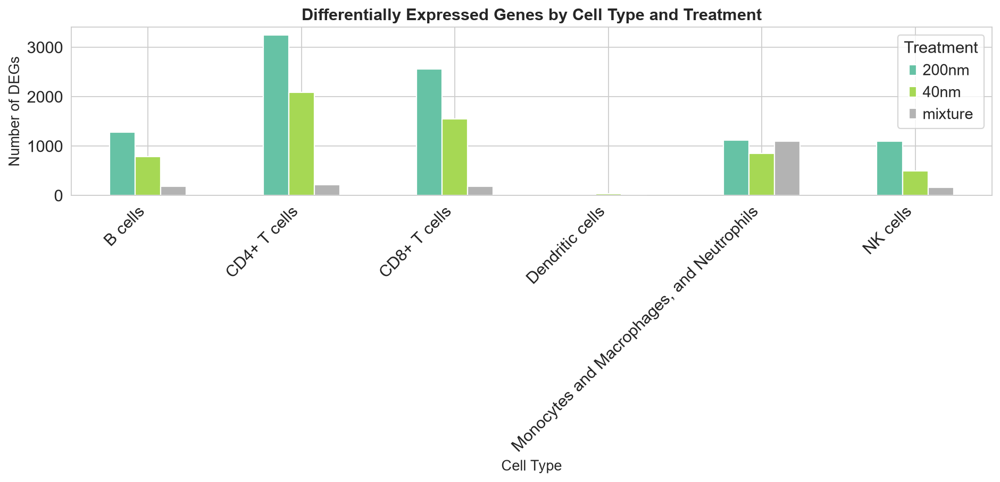

In [87]:
# Visualize DEG counts across cell types
if len(summary_df) > 0:
    fig, ax = plt.subplots(figsize=(12, 6))
    
    summary_pivot = summary_df.pivot(index='Cell Type', columns='Treatment', values='Total DEGs')
    summary_pivot.plot(kind='bar', ax=ax, colormap='Set2')
    
    ax.set_xlabel('Cell Type', fontsize=12)
    ax.set_ylabel('Number of DEGs', fontsize=12)
    ax.set_title('Differentially Expressed Genes by Cell Type and Treatment', fontsize=14, fontweight='bold')
    ax.legend(title='Treatment')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

In [88]:
print("\n" + "="*80)
print("PATHWAY ENRICHMENT ANALYSIS (Enrichr / GSEA)")
print("="*80)

# Extract top upregulated genes across treatments
top_genes_dict = {}
for treatment in ['40nm', '200nm', 'mixture']:
    df = sc.get.rank_genes_groups_df(adata_integrated, group=treatment, key=f'de_{treatment}_vs_control')
    up_genes = df[(df['pvals_adj'] < 0.05) & (df['logfoldchanges'] > 0.5)]['names'].head(50).tolist()
    top_genes_dict[treatment] = up_genes
    print(f"Top significant upregulated genes for {treatment.upper()}: {len(up_genes)}")

import gseapy as gp
gene_sets = ['KEGG_2021_Human', 'GO_Biological_Process_2023', 'MSigDB_Hallmark_2020']

for treatment, genes in top_genes_dict.items():
    if len(genes) >= 5:
        print(f"\nRunning Enrichr for {treatment.upper()} upregulated genes...")
        enr = gp.enrichr(gene_list=genes, gene_sets=gene_sets, outdir=None)
        sig_enr = enr.results[enr.results['Adjusted P-value'] < 0.05]
        if len(sig_enr) > 0:
            print(f"  Top enriched pathways ({treatment}):")
            display(sig_enr[['Gene_set', 'Term', 'Overlap', 'Adjusted P-value', 'Combined Score']].head(5))
        else:
            print(f"  Top pathway terms ({treatment}):")
            display(enr.results[['Gene_set', 'Term', 'Overlap', 'Adjusted P-value', 'Combined Score']].head(5))


PATHWAY ENRICHMENT ANALYSIS (Enrichr / GSEA)
Top significant upregulated genes for 40NM: 50
Top significant upregulated genes for 200NM: 50
Top significant upregulated genes for MIXTURE: 50

Running Enrichr for 40NM upregulated genes...
  Top enriched pathways (40nm):


,Gene_set,Term,Overlap,Adjusted P-value,Combined Score
0,KEGG_2021_Human,TNF signaling pathway,6/112,0.000026,379.462750
1,KEGG_2021_Human,IL-17 signaling pathway,5/94,0.000135,310.171502
2,KEGG_2021_Human,Rheumatoid arthritis,4/93,0.001597,181.731140
3,KEGG_2021_Human,NOD-like receptor signaling pathway,5/181,0.001597,116.645345
4,KEGG_2021_Human,NF-kappa B signaling pathway,4/104,0.001930,154.160471



Running Enrichr for 200NM upregulated genes...
  Top enriched pathways (200nm):


,Gene_set,Term,Overlap,Adjusted P-value,Combined Score
0,KEGG_2021_Human,Rheumatoid arthritis,9/93,9.051568e-11,1414.655308
1,KEGG_2021_Human,IL-17 signaling pathway,9/94,9.051568e-11,1392.873651
2,KEGG_2021_Human,TNF signaling pathway,8/112,1.237051e-08,793.397894
3,KEGG_2021_Human,Viral protein interaction with cytokine and cy...,7/100,1.480645e-07,662.420162
4,KEGG_2021_Human,Lipid and atherosclerosis,8/215,1.277358e-06,303.021712



Running Enrichr for MIXTURE upregulated genes...
  Top enriched pathways (mixture):


,Gene_set,Term,Overlap,Adjusted P-value,Combined Score
0,KEGG_2021_Human,Rheumatoid arthritis,8/93,3.891098e-09,1038.687547
1,KEGG_2021_Human,IL-17 signaling pathway,8/94,3.891098e-09,1022.727109
2,KEGG_2021_Human,Lipid and atherosclerosis,9/215,8.963466e-08,414.545927
3,KEGG_2021_Human,Viral protein interaction with cytokine and cy...,7/100,1.282345e-07,662.420162
4,KEGG_2021_Human,TNF signaling pathway,7/112,2.269804e-07,561.926565


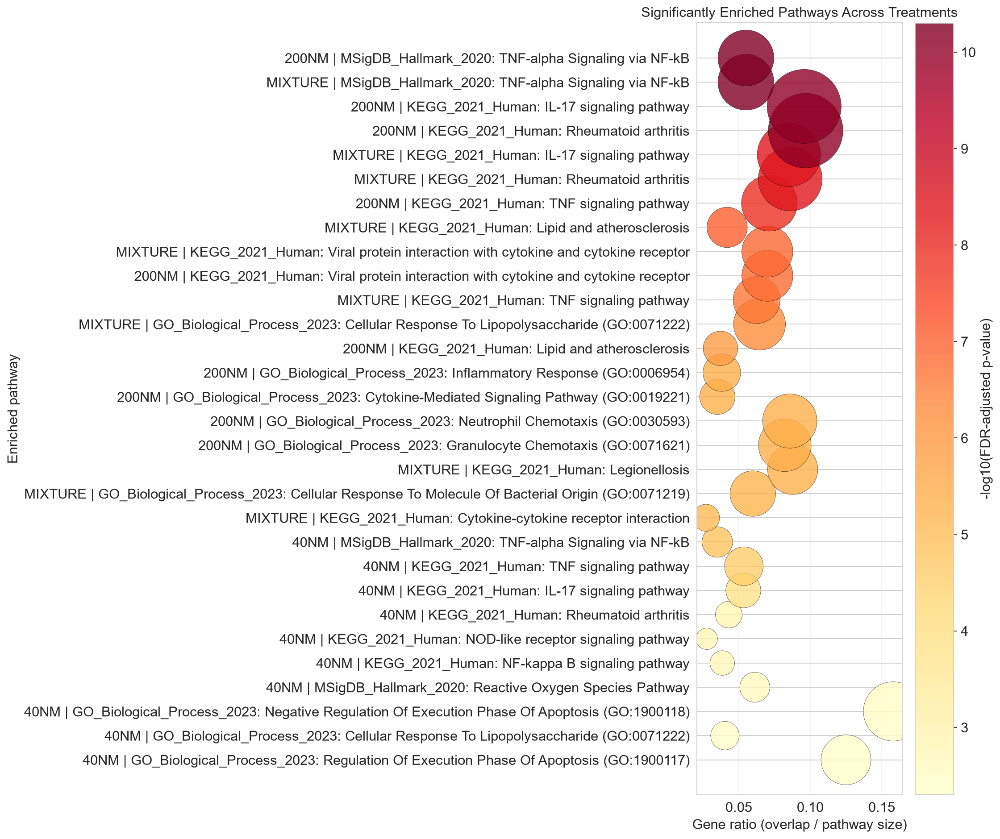

,Treatment,Gene_set,Term,Overlap,Adjusted P-value,Combined Score
1478,200nm,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,11/200,5.038980e-11,794.169656
612,200nm,KEGG_2021_Human,Rheumatoid arthritis,9/93,9.051568e-11,1414.655308
613,200nm,KEGG_2021_Human,IL-17 signaling pathway,9/94,9.051568e-11,1392.873651
614,200nm,KEGG_2021_Human,TNF signaling pathway,8/112,1.237051e-08,793.397894
615,200nm,KEGG_2021_Human,Viral protein interaction with cytokine and cy...,7/100,1.480645e-07,662.420162
616,200nm,KEGG_2021_Human,Lipid and atherosclerosis,8/215,1.277358e-06,303.021712
728,200nm,GO_Biological_Process_2023,Granulocyte Chemotaxis (GO:0071621),6/73,4.046231e-06,705.496292
726,200nm,GO_Biological_Process_2023,Neutrophil Chemotaxis (GO:0030593),6/70,4.046231e-06,749.499755
725,200nm,GO_Biological_Process_2023,Cytokine-Mediated Signaling Pathway (GO:0019221),9/257,4.046231e-06,316.473970
724,200nm,GO_Biological_Process_2023,Inflammatory Response (GO:0006954),9/236,4.046231e-06,360.251201


In [89]:
# Pathway enrichment dot plot across treatments
enrichment_tables = []

for treatment, genes in top_genes_dict.items():
    if len(genes) < 5:
        continue

    enr = gp.enrichr(
        gene_list=genes,
        gene_sets=gene_sets,
        outdir=None,
    )

    treatment_results = enr.results.copy()
    treatment_results["Treatment"] = treatment
    enrichment_tables.append(treatment_results)

if enrichment_tables:
    enrichment_results = pd.concat(enrichment_tables, ignore_index=True)

    significant_pathways = enrichment_results[
        enrichment_results["Adjusted P-value"] < 0.05
    ].copy()

    if not significant_pathways.empty:
        # Keep the ten most significant pathways for each treatment.
        plot_data = (
            significant_pathways
            .sort_values("Adjusted P-value")
            .groupby("Treatment", group_keys=False)
            .head(10)
            .copy()
        )

        plot_data["-log10(FDR)"] = -np.log10(
            plot_data["Adjusted P-value"].clip(lower=1e-300)
        )
        plot_data["Gene ratio"] = plot_data["Overlap"].str.split("/").apply(
            lambda overlap: int(overlap[0]) / int(overlap[1])
        )
        plot_data["Pathway"] = (
            plot_data["Treatment"].str.upper()
            + " | "
            + plot_data["Gene_set"]
            + ": "
            + plot_data["Term"]
        )
        plot_data = plot_data.sort_values("-log10(FDR)")

        fig, ax = plt.subplots(figsize=(14, max(6, len(plot_data) * 0.4)))

        scatter = ax.scatter(
            plot_data["Gene ratio"],
            plot_data["Pathway"],
            s=plot_data["Combined Score"].clip(lower=1) * 4,
            c=plot_data["-log10(FDR)"],
            cmap="YlOrRd",
            alpha=0.8,
            edgecolors="black",
            linewidths=0.3,
        )

        colorbar = fig.colorbar(scatter, ax=ax)
        colorbar.set_label("-log10(FDR-adjusted p-value)")

        ax.set_xlabel("Gene ratio (overlap / pathway size)")
        ax.set_ylabel("Enriched pathway")
        ax.set_title("Significantly Enriched Pathways Across Treatments")
        ax.grid(axis="x", alpha=0.25)

        plt.tight_layout()
        plt.show()

        display(
            plot_data[
                [
                    "Treatment",
                    "Gene_set",
                    "Term",
                    "Overlap",
                    "Adjusted P-value",
                    "Combined Score",
                ]
            ].sort_values(["Treatment", "Adjusted P-value"])
        )

    else:
        print("No pathways reached FDR < 0.05 for the selected upregulated genes.")
else:
    print("No treatment had at least five significant upregulated genes for enrichment.")

## Task 6: Size-Specific Effects

In this section, we will:
1. Compare responses to different nanoparticle sizes (40nm vs 200nm)
2. Identify size-specific gene signatures
3. Analyze whether the mixture shows additive or synergistic effects
4. Visualize size-dependent responses

### 6.1 Direct Size Comparison

In [90]:
print("\n" + "="*80)
print("SIZE-SPECIFIC EFFECTS ANALYSIS")
print("="*80)

# Compare 40nm vs 200nm directly
adata_integrated.obs['size_comparison'] = adata_integrated.obs['sample'].apply(
    lambda x: '40nm' if x == '40nm' else '200nm' if x == '200nm' else 'other'
)

adata_size_comp = adata_integrated[adata_integrated.obs['size_comparison'] != 'other'].copy()

print(f"\nCells in comparison:")
print(adata_size_comp.obs['size_comparison'].value_counts())

# Run differential expression
sc.tl.rank_genes_groups(
    adata_size_comp,
    groupby='size_comparison',
    groups=['40nm'],
    reference='200nm',
    method='wilcoxon',
    layer='normlog',
    key_added='de_40nm_vs_200nm'
)


SIZE-SPECIFIC EFFECTS ANALYSIS

Cells in comparison:
size_comparison
200nm    12413
40nm      8579
Name: count, dtype: int64
ranking genes
    finished: added to `.uns['de_40nm_vs_200nm']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


In [91]:
# Extract size-specific DEGs
size_degs = sc.get.rank_genes_groups_df(
    adata_size_comp,
    group='40nm',
    key='de_40nm_vs_200nm'
)

sig_size_degs = size_degs[(size_degs['pvals_adj'] < 0.05) & (abs(size_degs['logfoldchanges']) > 0.5)]

print("\n" + "="*80)
print("SIZE-SPECIFIC DIFFERENTIALLY EXPRESSED GENES")
print("="*80)
print(f"\nTotal significant DEGs (40nm vs 200nm): {len(sig_size_degs)}")
print(f"  Higher in 40nm: {len(sig_size_degs[sig_size_degs['logfoldchanges'] > 0])}")
print(f"  Higher in 200nm: {len(sig_size_degs[sig_size_degs['logfoldchanges'] < 0])}")

print(f"\nTop 10 genes higher in 40nm:")
display(sig_size_degs[sig_size_degs['logfoldchanges'] > 0].head(10))

print(f"\nTop 10 genes higher in 200nm:")
display(sig_size_degs[sig_size_degs['logfoldchanges'] < 0].head(10))


SIZE-SPECIFIC DIFFERENTIALLY EXPRESSED GENES

Total significant DEGs (40nm vs 200nm): 497
  Higher in 40nm: 182
  Higher in 200nm: 315

Top 10 genes higher in 40nm:


,names,scores,logfoldchanges,pvals,pvals_adj
0,MT-ATP8,48.969963,1.243131,0.000000e+00,0.000000e+00
1,RPS10,47.032700,0.605060,0.000000e+00,0.000000e+00
2,RPL36A,37.355869,0.789188,2.035955e-305,1.630257e-301
5,PPDPF,33.834877,1.074842,6.057230e-251,2.425113e-247
8,PRKCB,30.000000,1.050585,9.813157e-198,2.143015e-194
9,EIF2S2,29.683174,0.880340,1.266153e-193,2.534627e-190
10,TXNRD1,29.559832,0.918327,4.909588e-192,9.072164e-189
11,RP11-640M9.1,27.525204,1.121961,8.767847e-167,1.504437e-163
14,SLC3A2,26.623198,0.952753,3.658119e-156,4.881962e-153
15,CROCC,24.383482,1.449030,2.560388e-131,3.237138e-128



Top 10 genes higher in 200nm:


,names,scores,logfoldchanges,pvals,pvals_adj
23187,KIAA1598,-2.761729,-1.411143,0.005750,0.049012
23189,MYO1G,-2.768442,-0.707780,0.005632,0.048151
23191,MMP1,-2.771545,-0.675656,0.005579,0.047745
23194,LILRA3,-2.783529,-3.203844,0.005377,0.046214
23203,AK4,-2.803390,-1.227489,0.005057,0.043854
23205,FCAR,-2.807714,-1.686902,0.004989,0.043395
23206,IL1A,-2.807786,-0.942826,0.004988,0.043395
23211,F3,-2.822945,-1.197403,0.004758,0.041693
23212,HNMT,-2.823645,-1.701709,0.004748,0.041669
23216,PTMS,-2.831661,-0.775481,0.004631,0.040872


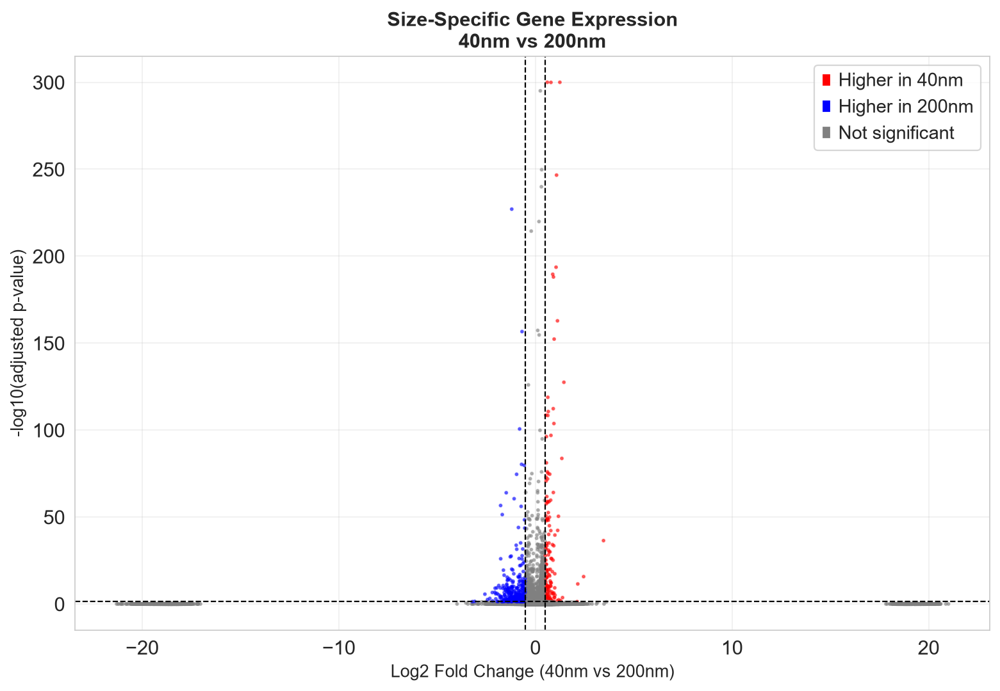

In [92]:
# Volcano plot for size comparison
fig, ax = plt.subplots(figsize=(10, 7))

size_degs['-log10_pval'] = -np.log10(size_degs['pvals_adj'] + 1e-300)

colors = []
for _, row in size_degs.iterrows():
    if row['pvals_adj'] < 0.05 and row['logfoldchanges'] > 0.5:
        colors.append('red')
    elif row['pvals_adj'] < 0.05 and row['logfoldchanges'] < -0.5:
        colors.append('blue')
    else:
        colors.append('gray')

ax.scatter(size_degs['logfoldchanges'], size_degs['-log10_pval'], c=colors, alpha=0.5, s=3)

# Add threshold lines
ax.axhline(y=-np.log10(0.05), color='black', linestyle='--', linewidth=1)
ax.axvline(x=0.5, color='black', linestyle='--', linewidth=1)
ax.axvline(x=-0.5, color='black', linestyle='--', linewidth=1)

ax.set_xlabel('Log2 Fold Change (40nm vs 200nm)', fontsize=12)
ax.set_ylabel('-log10(adjusted p-value)', fontsize=12)
ax.set_title('Size-Specific Gene Expression\n40nm vs 200nm', fontsize=14, fontweight='bold')
ax.grid(True, alpha=0.3)

# Add legend
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor='red', label='Higher in 40nm'),
    Patch(facecolor='blue', label='Higher in 200nm'),
    Patch(facecolor='gray', label='Not significant')
]
ax.legend(handles=legend_elements, loc='upper right')

plt.tight_layout()
plt.show()

### 6.2 Mixture Effect Analysis

In [93]:
print("\n" + "="*80)
print("MIXTURE EFFECT ANALYSIS")
print("="*80)

# Get DEGs for each condition vs control
degs_40nm = sc.get.rank_genes_groups_df(
    adata_integrated,
    group='40nm',
    key='de_40nm_vs_control'
)

degs_200nm = sc.get.rank_genes_groups_df(
    adata_integrated,
    group='200nm',
    key='de_200nm_vs_control'
)

degs_mixture = sc.get.rank_genes_groups_df(
    adata_integrated,
    group='mixture',
    key='de_mixture_vs_control'
)

# Get significant genes for each
sig_40nm = set(degs_40nm[(degs_40nm['pvals_adj'] < 0.05) & (abs(degs_40nm['logfoldchanges']) > 0.5)]['names'])
sig_200nm = set(degs_200nm[(degs_200nm['pvals_adj'] < 0.05) & (abs(degs_200nm['logfoldchanges']) > 0.5)]['names'])
sig_mixture = set(degs_mixture[(degs_mixture['pvals_adj'] < 0.05) & (abs(degs_mixture['logfoldchanges']) > 0.5)]['names'])

print(f"\nSignificant DEGs:")
print(f"  40nm vs control: {len(sig_40nm)}")
print(f"  200nm vs control: {len(sig_200nm)}")
print(f"  Mixture vs control: {len(sig_mixture)}")

# Analyze overlap
shared_40_200 = sig_40nm & sig_200nm
unique_40 = sig_40nm - sig_200nm - sig_mixture
unique_200 = sig_200nm - sig_40nm - sig_mixture
unique_mixture = sig_mixture - sig_40nm - sig_200nm
all_shared = sig_40nm & sig_200nm & sig_mixture

print(f"\nGene set overlaps:")
print(f"  Shared between 40nm and 200nm: {len(shared_40_200)}")
print(f"  Shared across all three: {len(all_shared)}")
print(f"  Unique to 40nm: {len(unique_40)}")
print(f"  Unique to 200nm: {len(unique_200)}")
print(f"  Unique to mixture: {len(unique_mixture)}")


MIXTURE EFFECT ANALYSIS

Significant DEGs:
  40nm vs control: 1842
  200nm vs control: 3132
  Mixture vs control: 271

Gene set overlaps:
  Shared between 40nm and 200nm: 1409
  Shared across all three: 185
  Unique to 40nm: 405
  Unique to 200nm: 1683
  Unique to mixture: 18


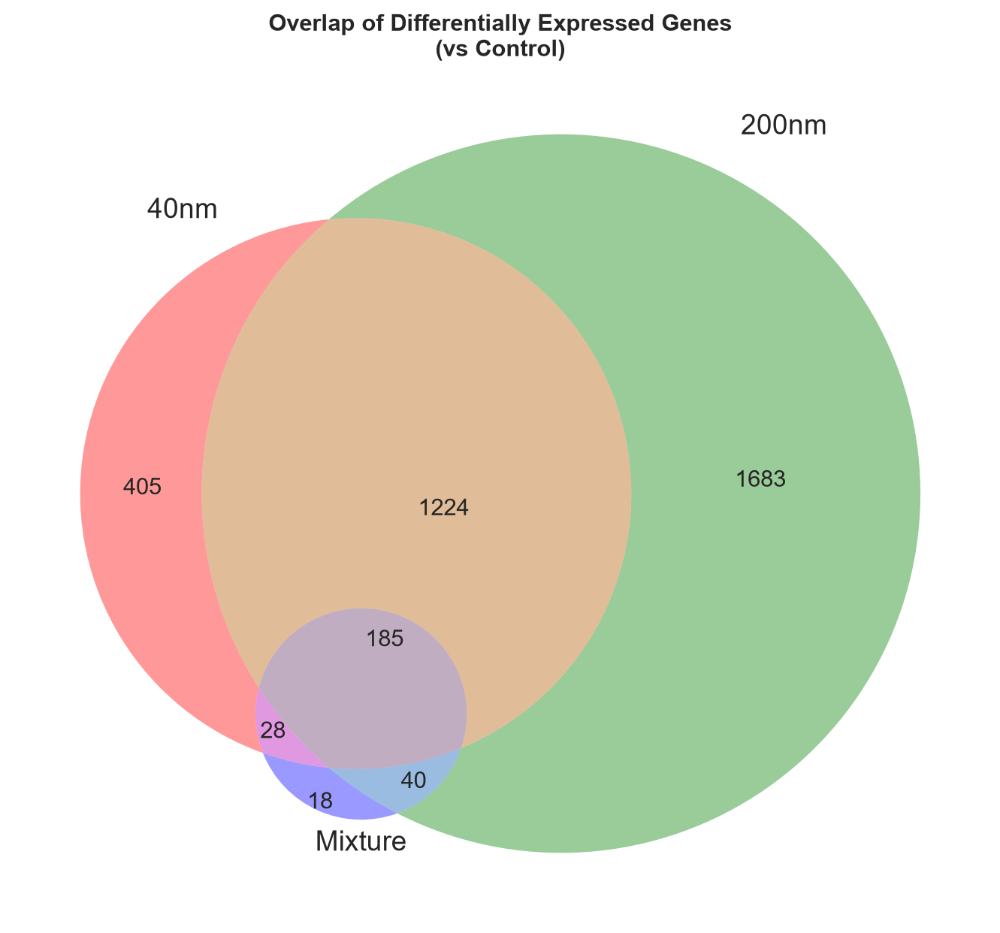

In [94]:
# Venn diagram of DEG overlap
from matplotlib_venn import venn3

fig, ax = plt.subplots(figsize=(10, 8))

venn3(
    [sig_40nm, sig_200nm, sig_mixture],
    set_labels=('40nm', '200nm', 'Mixture'),
    ax=ax
)

ax.set_title('Overlap of Differentially Expressed Genes\n(vs Control)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [95]:
# Analyze mixture effect: additive vs synergistic
print("\n" + "="*80)
print("MIXTURE EFFECT TYPE ANALYSIS")
print("="*80)

# Merge DEG data
merged = degs_40nm[['names', 'logfoldchanges']].rename(columns={'logfoldchanges': 'logFC_40nm'})
merged = merged.merge(
    degs_200nm[['names', 'logfoldchanges']].rename(columns={'logfoldchanges': 'logFC_200nm'}),
    on='names'
)
merged = merged.merge(
    degs_mixture[['names', 'logfoldchanges', 'pvals_adj']].rename(columns={'logfoldchanges': 'logFC_mixture', 'pvals_adj': 'pval_mixture'}),
    on='names'
)

# Calculate expected additive effect
merged['expected_additive'] = (merged['logFC_40nm'] + merged['logFC_200nm']) / 2

# Calculate deviation from additive
merged['deviation'] = merged['logFC_mixture'] - merged['expected_additive']

# Classify effect type
def classify_effect(row):
    if row['pval_mixture'] >= 0.05:
        return 'Not significant'
    elif abs(row['deviation']) < 0.25:
        return 'Additive'
    elif row['deviation'] > 0.25:
        return 'Synergistic (>additive)'
    else:
        return 'Antagonistic (<additive)'

merged['effect_type'] = merged.apply(classify_effect, axis=1)

print(f"\nEffect type distribution:")
print(merged['effect_type'].value_counts())

# Show examples of each effect type
for effect_type in ['Synergistic (>additive)', 'Antagonistic (<additive)', 'Additive']:
    examples = merged[merged['effect_type'] == effect_type].sort_values('deviation', ascending=(effect_type == 'Antagonistic (<additive)')).head(5)
    if len(examples) > 0:
        print(f"\nTop 5 {effect_type} genes:")
        display(examples[['names', 'logFC_40nm', 'logFC_200nm', 'expected_additive', 'logFC_mixture', 'deviation', 'pval_mixture']])


MIXTURE EFFECT TYPE ANALYSIS

Effect type distribution:
effect_type
Not significant             21025
Additive                     1747
Synergistic (>additive)      1135
Antagonistic (<additive)      115
Name: count, dtype: int64

Top 5 Synergistic (>additive) genes:


,names,logFC_40nm,logFC_200nm,expected_additive,logFC_mixture,deviation,pval_mixture
23140,TMC8,-0.700042,-1.385174,-1.042608,-0.189397,0.853211,1.053896e-02
23595,LINC01138,-1.407269,-1.693704,-1.550487,-0.711151,0.839336,8.250718e-13
23960,ITFG1,-0.773298,-1.058333,-0.915815,-0.143630,0.772185,4.240167e-03
22474,ZBED6,-0.862155,-1.223899,-1.043027,-0.271796,0.771231,1.823564e-02
23946,SEC22A,-0.995842,-1.180126,-1.087984,-0.324654,0.763330,4.324593e-10



Top 5 Antagonistic (<additive) genes:


,names,logFC_40nm,logFC_200nm,expected_additive,logFC_mixture,deviation,pval_mixture
19062,LYZ,-2.147634,0.422441,-0.862597,-2.624554,-1.761957,7.345972e-03
1,IL8,2.877189,3.558292,3.217741,1.631541,-1.586199,8.029871e-143
22972,IFITM1,-1.390872,-1.222508,-1.306690,-2.878602,-1.571912,1.308999e-32
70,CXCL5,2.913502,3.451187,3.182345,1.876041,-1.306303,1.456378e-11
0,MTRNR2L12,1.757337,1.443711,1.600524,0.303058,-1.297466,2.327578e-42



Top 5 Additive genes:


,names,logFC_40nm,logFC_200nm,expected_additive,logFC_mixture,deviation,pval_mixture
22846,TAF7,-0.387903,-0.494101,-0.441002,-0.191329,0.249673,2.505084e-04
20561,NSRP1,-0.200267,-0.533503,-0.366885,-0.117639,0.249247,4.648609e-02
21575,CCDC94,-0.346737,-0.690494,-0.518616,-0.269402,0.249213,3.233314e-04
22988,RP6-206I17.1,-0.838906,-1.134975,-0.986940,-0.738140,0.248800,4.827099e-14
22477,ARPC1A,-0.380476,-0.479417,-0.429947,-0.181569,0.248378,1.832566e-03


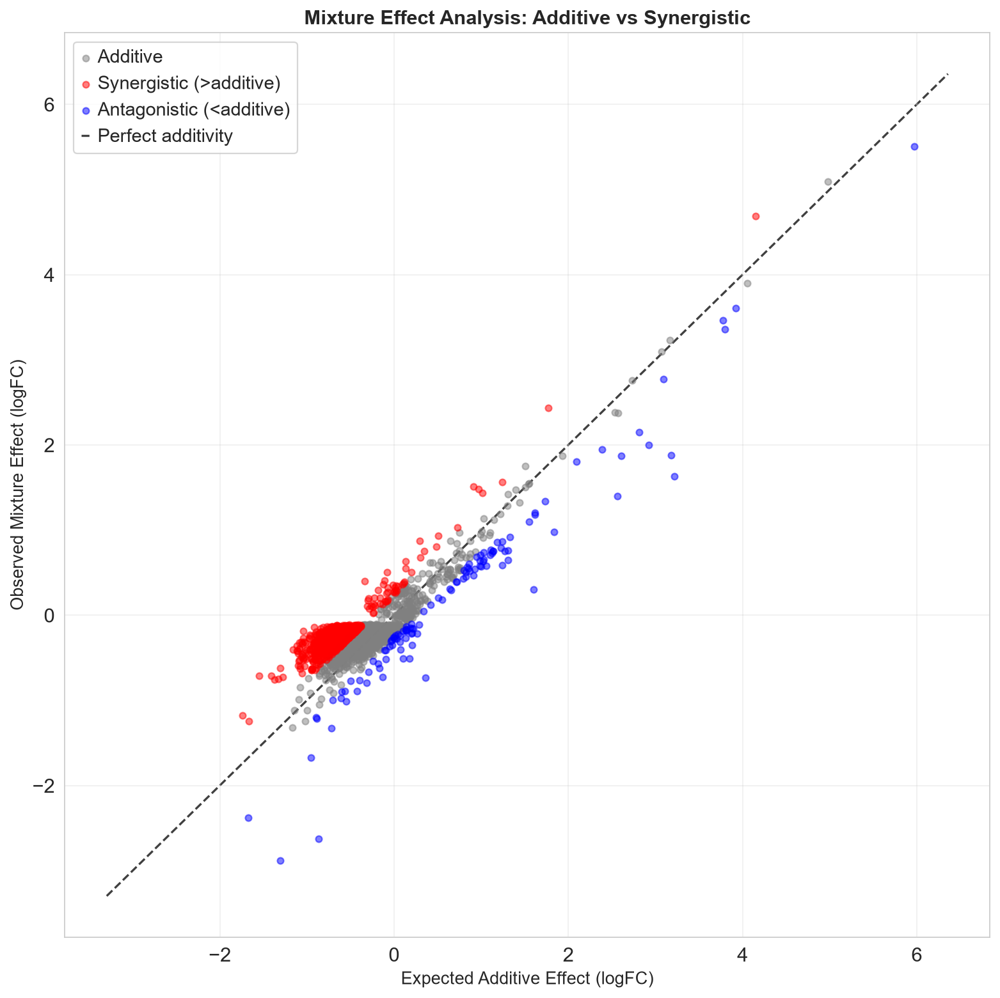

In [96]:
# Scatter plot: expected vs observed mixture effect
fig, ax = plt.subplots(figsize=(10, 10))

# Filter for significant genes
sig_merged = merged[merged['pval_mixture'] < 0.05]

# Color by effect type
colors = {
    'Additive': 'gray',
    'Synergistic (>additive)': 'red',
    'Antagonistic (<additive)': 'blue'
}

for effect_type, color in colors.items():
    subset = sig_merged[sig_merged['effect_type'] == effect_type]
    ax.scatter(
        subset['expected_additive'],
        subset['logFC_mixture'],
        c=color,
        label=effect_type,
        alpha=0.5,
        s=20
    )

# Add diagonal line (perfect additivity)
lims = [
    np.min([ax.get_xlim(), ax.get_ylim()]),
    np.max([ax.get_xlim(), ax.get_ylim()]),
]
ax.plot(lims, lims, 'k--', alpha=0.75, zorder=0, label='Perfect additivity')

ax.set_xlabel('Expected Additive Effect (logFC)', fontsize=12)
ax.set_ylabel('Observed Mixture Effect (logFC)', fontsize=12)
ax.set_title('Mixture Effect Analysis: Additive vs Synergistic', fontsize=14, fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

### 6.3 Size-Dependent Response Patterns


SIZE-DEPENDENT RESPONSE PATTERNS


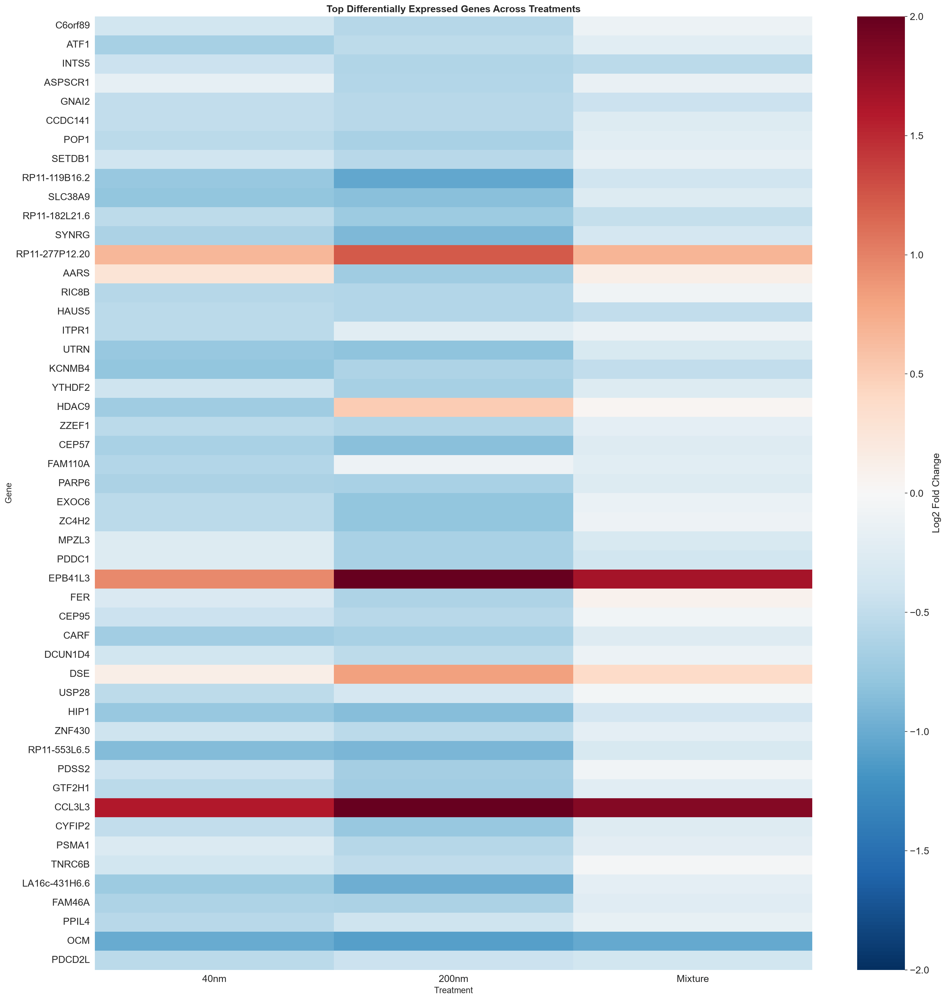

In [97]:
# Heatmap comparing responses across all conditions
print("\n" + "="*80)
print("SIZE-DEPENDENT RESPONSE PATTERNS")
print("="*80)

# Get top DEGs from any comparison
all_sig_genes = sig_40nm | sig_200nm | sig_mixture
top_genes = list(all_sig_genes)[:50]  # Limit to top 50 for visualization

if len(top_genes) > 0:
    # Create a matrix of log fold changes
    fc_matrix = pd.DataFrame()
    
    for gene in top_genes:
        fc_40 = degs_40nm[degs_40nm['names'] == gene]['logfoldchanges'].values[0] if gene in degs_40nm['names'].values else 0
        fc_200 = degs_200nm[degs_200nm['names'] == gene]['logfoldchanges'].values[0] if gene in degs_200nm['names'].values else 0
        fc_mix = degs_mixture[degs_mixture['names'] == gene]['logfoldchanges'].values[0] if gene in degs_mixture['names'].values else 0
        
        fc_matrix[gene] = [fc_40, fc_200, fc_mix]
    
    fc_matrix.index = ['40nm', '200nm', 'Mixture']
    
    # Plot heatmap
    fig, ax = plt.subplots(figsize=(20, 20))
    
    sns.heatmap(
        fc_matrix.T,
        cmap='RdBu_r',
        center=0,
        vmin=-2,
        vmax=2,
        cbar_kws={'label': 'Log2 Fold Change'},
        ax=ax,
        yticklabels=True
    )
    
    ax.set_xlabel('Treatment', fontsize=12)
    ax.set_ylabel('Gene', fontsize=12)
    ax.set_title('Top Differentially Expressed Genes Across Treatments', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
else:
    print("\nNo significant genes found for heatmap")


NANOPLASTIC STRESS & TOXICITY SIGNATURES
computing score 'ROS_Oxidative_Stress'
    finished: added
    'ROS_Oxidative_Stress', score of gene set (adata.obs).
    299 total control genes are used. (0:00:00)
  ✓ Scored ROS_Oxidative_Stress using 10 detected genes
computing score 'NFkB_Inflammation'
    finished: added
    'NFkB_Inflammation', score of gene set (adata.obs).
    350 total control genes are used. (0:00:00)
  ✓ Scored NFkB_Inflammation using 9 detected genes
computing score 'Lysosomal_Autophagy'
    finished: added
    'Lysosomal_Autophagy', score of gene set (adata.obs).
    199 total control genes are used. (0:00:00)
  ✓ Scored Lysosomal_Autophagy using 8 detected genes
computing score 'Apoptosis_Stress'
    finished: added
    'Apoptosis_Stress', score of gene set (adata.obs).
    399 total control genes are used. (0:00:00)
  ✓ Scored Apoptosis_Stress using 9 detected genes


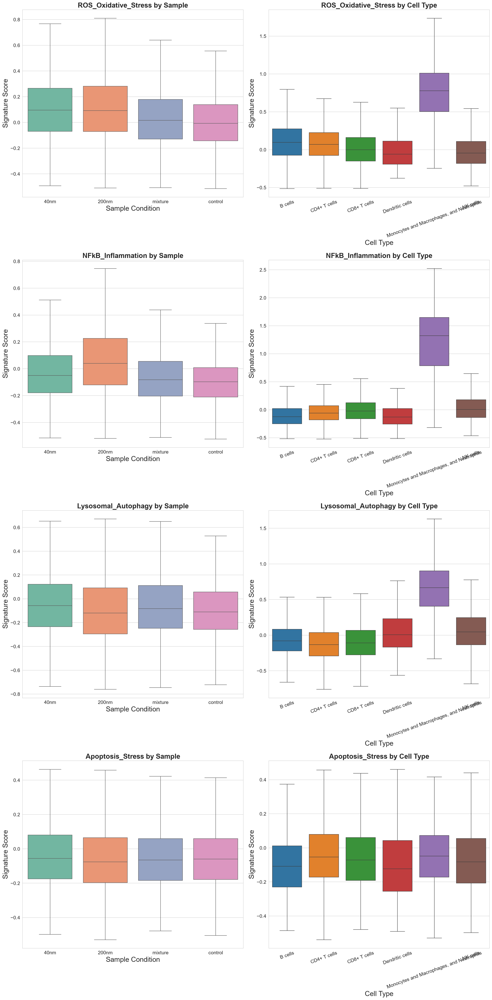

In [98]:
print("\n" + "="*80)
print("NANOPLASTIC STRESS & TOXICITY SIGNATURES")
print("="*80)

toxicity_gene_sets = {
    'ROS_Oxidative_Stress': ['SOD1', 'SOD2', 'GPX1', 'GPX4', 'HMOX1', 'TXN', 'CAT', 'PRDX1', 'NQO1', 'GCLC'],
    'NFkB_Inflammation': ['NFKB1', 'NFKBIA', 'RELA', 'IL1B', 'TNF', 'CXCL8', 'IL6', 'CCL2', 'CCL3', 'CCL4'],
    'Lysosomal_Autophagy': ['LAMP1', 'LAMP2', 'CTSD', 'CTSB', 'SQSTM1', 'MAP1LC3B', 'ATG5', 'ATG7'],
    'Apoptosis_Stress': ['BAX', 'BAK1', 'BCL2L1', 'CASP3', 'CASP8', 'CDKN1A', 'TP53', 'FAS', 'BID']
}

# Score each stress gene signature across all single cells
for sig_name, genes in toxicity_gene_sets.items():
    present_genes = [g for g in genes if g in adata_integrated.var_names]
    if len(present_genes) >= 3:
        sc.tl.score_genes(adata_integrated, gene_list=present_genes, score_name=sig_name, layer='normlog')
        print(f"  ✓ Scored {sig_name} using {len(present_genes)} detected genes")

# Visualize toxicity signature scores across samples and cell types
score_cols = [s for s in toxicity_gene_sets.keys() if s in adata_integrated.obs.columns]
if score_cols:
    fig, axes = plt.subplots(len(score_cols), 2, figsize=(20, 10 * len(score_cols)))
    if len(score_cols) == 1:
        axes = np.expand_dims(axes, 0)
        
    for i, sig_name in enumerate(score_cols):
        # Comparison by Sample
        sns.boxplot(
            data=adata_integrated.obs,
            x='sample',
            y=sig_name,
            order=sample_identifiers,
            palette='Set2',
            ax=axes[i, 0],
            showfliers=False
        )
        axes[i, 0].set_title(f'{sig_name} by Sample', fontsize=20, fontweight='bold')
        axes[i, 0].set_xlabel('Sample Condition', fontsize=20)
        axes[i, 0].set_ylabel('Signature Score', fontsize=20)
        
        # Comparison by Cell Type
        sns.boxplot(
            data=adata_integrated.obs,
            x='cell_type',
            y=sig_name,
            palette='tab10',
            ax=axes[i, 1],
            showfliers=False
        )
        axes[i, 1].set_title(f'{sig_name} by Cell Type', fontsize=20, fontweight='bold')
        axes[i, 1].set_xlabel('Cell Type', fontsize=20)
        axes[i, 1].set_ylabel('Signature Score', fontsize=20)
        axes[i, 1].tick_params(axis='x', rotation=20)

    plt.tight_layout()
    plt.show()

In [99]:
# Save final processed data
output_path = 'data/adata_integrated_complete.h5ad'
adata_integrated.write(output_path)